<a href="https://colab.research.google.com/github/JasmineNag/Appliance-Energy-Prediction/blob/main/Copy_of_Team_Appliance_Energy_Prediction_ML_Submission_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Appliance Energy Prediction**    



##### **Project Type**    - Regression
##### **Contribution**    - Team
##### **Team Member 1 -** Jasmine Sulekha Nag
##### **Team Member 2 -** Ishan Barway


# **Project Summary -**


The objective of the project was to predict the energy consumption of household appliances based on environmental factors such as temperature and humidity levels. The project involved the use of various regression models such as linear regression, Lasso regularization, decision tree regressor, and extreme gradient boost regressor.

The linear regression model showed a relatively low accuracy of 14% for the training dataset and 15% for the testing dataset. An attempt to improve the linear regression model using Lasso regularization did not yield any significant improvement in accuracy.

The decision tree regressor was then used to predict the energy consumption of household appliances, and it showed a significant improvement in accuracy compared to the linear regression model. The decision tree regressor showed an accuracy of 50% for the training dataset and 12% for the testing dataset.

However, the most significant improvement in accuracy was observed with the extreme gradient boost regressor, which showed an accuracy of 93% for the training dataset and 35% for the testing dataset. This model was considered the most accurate in predicting energy consumption for household appliances based on the available data.

Overall, the project involved the use of different regression models to predict the energy consumption of household appliances based on environmental factors. The extreme gradient boost regressor proved to be the most accurate model, showing the highest accuracy for both the training and testing datasets.

# **GitHub Link -**

https://github.com/JasmineNag/Appliance-Energy-Prediction.git

# **Problem Statement**


The data set is at 10 min for about 4.5 months. The house temperature and humidity conditions were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for 10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters. Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis (rp5.ru), and merged together with the experimental data sets using the date and time column. Two random variables have been included in the data set for testing the regression models and to filter out non predictive attributes (parameters)

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
from numpy import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as miss

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.model_selection import GridSearchCV ,RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings
warnings.filterwarnings('ignore') 

from scipy.stats import *
from sklearn.linear_model import Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor

### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CAPSTONE PROJECT2/Appliance Energy Prediction/data_application_energy.csv')

### Dataset First View

In [ ]:
# Dataset First Look
df.head(10)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.20,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.500000,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.20,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.20,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.700000,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.20,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.800000,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.20,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
5,2016-01-11 17:50:00,50,40,19.890000,46.026667,19.20,44.500000,19.79,44.933333,18.890000,...,17.000000,45.29,6.016667,734.000000,92.000000,5.333333,43.833333,4.800000,44.919484,44.919484
6,2016-01-11 18:00:00,60,50,19.890000,45.766667,19.20,44.500000,19.79,44.900000,18.890000,...,17.000000,45.29,5.900000,734.100000,92.000000,5.000000,40.000000,4.700000,47.233763,47.233763
7,2016-01-11 18:10:00,60,50,19.856667,45.560000,19.20,44.500000,19.73,44.900000,18.890000,...,17.000000,45.29,5.916667,734.166667,91.833333,5.166667,40.000000,4.683333,33.039890,33.039890
8,2016-01-11 18:20:00,60,40,19.790000,45.597500,19.20,44.433333,19.73,44.790000,18.890000,...,17.000000,45.29,5.933333,734.233333,91.666667,5.333333,40.000000,4.666667,31.455702,31.455702
9,2016-01-11 18:30:00,70,40,19.856667,46.090000,19.23,44.400000,19.79,44.863333,18.890000,...,17.000000,45.29,5.950000,734.300000,91.500000,5.500000,40.000000,4.650000,3.089314,3.089314


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print('Total columns are',len(df.columns))
print('Total rows are',len(df['lights']))

Total columns are 29
Total rows are 19735


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print('There are total',len(df[df.duplicated()]), 'duplicate columns.')

There are total 0 duplicate columns.


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
for i in df.columns:
  print(f' {i} - {len(df[df[i].isnull()])} ')

 date - 0 
 Appliances - 0 
 lights - 0 
 T1 - 0 
 RH_1 - 0 
 T2 - 0 
 RH_2 - 0 
 T3 - 0 
 RH_3 - 0 
 T4 - 0 
 RH_4 - 0 
 T5 - 0 
 RH_5 - 0 
 T6 - 0 
 RH_6 - 0 
 T7 - 0 
 RH_7 - 0 
 T8 - 0 
 RH_8 - 0 
 T9 - 0 
 RH_9 - 0 
 T_out - 0 
 Press_mm_hg - 0 
 RH_out - 0 
 Windspeed - 0 
 Visibility - 0 
 Tdewpoint - 0 
 rv1 - 0 
 rv2 - 0 


<Axes: >

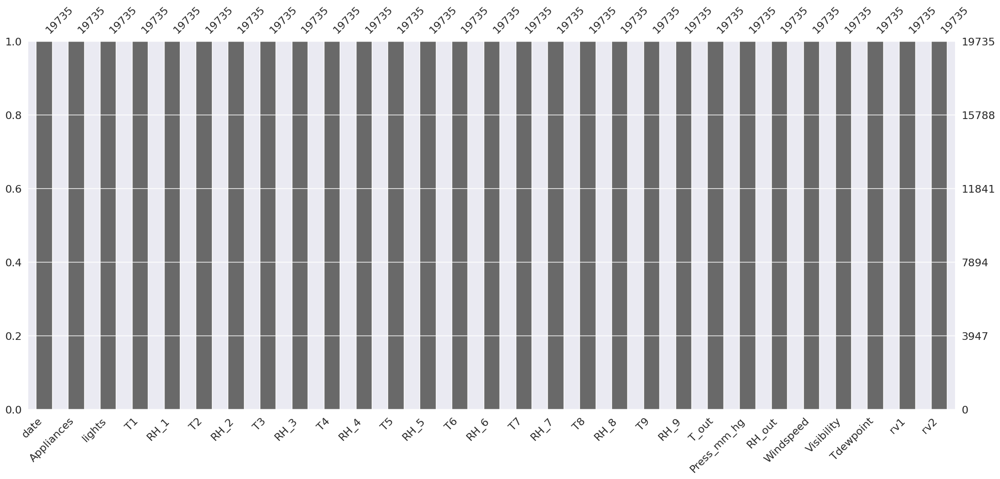

In [ ]:
# Visualizing the missing values
miss.bar(df)

### What did you know about your dataset?

Answer Here


*   There are total 29 features. Out of which 'Appliances' is our dependent variable.

*  There are no duplicate columns and no null values.
*   The datatype is mixed and not so specific.








## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


### Variables Description 

* **T1 :**  Temperature in kitchen area, in Celsius

* **T2 :**  Temperature in living room area, in Celsius

* **T3 :**  Temperature in laundry room area, in Celsius

* **T4 :**  Temperature in office room, in Celsius

* **T5 :**  Temperature in bathroom, in Celsius

* **T6 :**  Temperature outside the building (north side), in Celsius

* **T7 :**  Temperature in ironing room, in Celsius

* **T8 :**  Temperature in teenager room 2, in Celsius

* **T9 :**  Temperature in parents room, in Celsius

* **RH1 :**  Humidity in kitchen area, in %

* **RH2 :**  Humidity in living room area, in %

* **RH3 :**  Humidity in laundry room area, in %

* **RH4 :**  Humidity in office room, in %

* **RH5 :**  Humidity in bathroom, in %

* **RH6 :**  Humidity in outside the building (north side), in %

* **RH7 :**  Humidity in ironing room, in %

* **RH8 :**  Humidity in teenager room 2, in % 

* **RH9 :**  Humidity in parents room, in %

* **To :**  Temperature outside (from Chievres weather station), in Celsius

* **Pressure :**  (from Chievres weather station), in mm Hg

* **Hg RHout :**  Humidity outside (from Chieves weather station), in %

* **Wind speed :**  (from Chievres weather station), in m/s

* **Visibility :**  (from Chievres weather station), in km

* **Tdewpoint :**  (from Chievres weather station), in Å°C

* **Appliances, energy use in Wh :**  Dependent variable

####**Feature ranges**

Temperature range : -6 to 30 deg

Humidity range : 1 to 100 %

Windspeed range: 0 to 14 m/s

Visibility range: 1 to 66 km

Pressure range: 729 to 772 mm Hg

Appliance Energy Usage range: 10 to 1080 Wh

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df.columns.tolist():
  print("Unique values in ",i,"are",df[i].nunique(),".")

Unique values in  date are 19735 .
Unique values in  Appliances are 92 .
Unique values in  lights are 8 .
Unique values in  T1 are 722 .
Unique values in  RH_1 are 2547 .
Unique values in  T2 are 1650 .
Unique values in  RH_2 are 3376 .
Unique values in  T3 are 1426 .
Unique values in  RH_3 are 2618 .
Unique values in  T4 are 1390 .
Unique values in  RH_4 are 2987 .
Unique values in  T5 are 2263 .
Unique values in  RH_5 are 7571 .
Unique values in  T6 are 4446 .
Unique values in  RH_6 are 9709 .
Unique values in  T7 are 1955 .
Unique values in  RH_7 are 5891 .
Unique values in  T8 are 2228 .
Unique values in  RH_8 are 6649 .
Unique values in  T9 are 924 .
Unique values in  RH_9 are 3388 .
Unique values in  T_out are 1730 .
Unique values in  Press_mm_hg are 2189 .
Unique values in  RH_out are 566 .
Unique values in  Windspeed are 189 .
Unique values in  Visibility are 413 .
Unique values in  Tdewpoint are 1409 .
Unique values in  rv1 are 19735 .
Unique values in  rv2 are 19735 .


## 3. ***Data Wrangling***

### Data Wrangling Code

The Function for calculating the outliers.

In [ ]:
def cal_out(df):
  '''The Following piece of code is calculating the outliers for every feature
     and replacing it with null values, so that by calling the null values we could easily find the number of  oultiers.'''
  
  for i in df.columns:
    sort = df[i].sort_values()
    Q1 = np.percentile(sort , 25 , interpolation='midpoint')
    Q2 = np.percentile(sort , 50 , interpolation='midpoint')
    Q3 = np.percentile(sort , 75 , interpolation='midpoint')

    IQR = Q3 - Q1
    
    Lower_limit = Q1 - (1.5 * IQR)
    Upper_limit = Q3 + (1.5 * IQR)
    
    for j in df[i]:
      if ((j > Upper_limit) or (j < Lower_limit)) :
        third_df[i].replace( j , np.nan,inplace = True)
  
  return third_df

In [ ]:
# Write your code to make your dataset analysis ready.
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


Renaming The Columns according to the Variable Description.

In [ ]:
df.rename(columns={'T1': 'kitchen', 'RH_1':'hu_Kitchen', 'T2':'living_room', 'RH_2': 'hu_living', 'T3':'Laundry_room',
       'RH_3':'hu_laundry', 'T4':'office_room', 'RH_4':'hu_office', 'T5':'bathroom', 'RH_5':'hu_bath', 'T6':'build_out'
       , 'RH_6':'hu_build_out', 'T7':'ironing_room', 'RH_7':'hu_ironing_room', 'T8':'teen_room',
       'RH_8':'hu_teen', 'T9':'parents_room', 'RH_9':'hu_parent', 'T_out':'temp_out', 'RH_out':'out_humidity'},inplace = True)

In [ ]:
df.head()

,date,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,...,parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [ ]:
# Discription
df.describe()

,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,hu_office,...,parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


What is the mean comparison of all the features with every other feature?

In [ ]:
# I have made a empty DF first with reqired name of columns and then done with the other functionalities.
mean = pd.DataFrame(columns={'features','mean'})
mean['features']=['Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2']

In [ ]:
# for calculating the mean, I have created the empty dataframe first and then used the following code to arrange the mean for every feature.
for j,i in enumerate(mean['features']):
    mean['mean'][j]=df[i].mean()

print(mean)

          mean         features
0    97.694958       Appliances
1     3.801875           lights
2    21.686571          kitchen
3    40.259739       hu_Kitchen
4    20.341219      living_room
5     40.42042        hu_living
6    22.267611     Laundry_room
7      39.2425       hu_laundry
8    20.855335      office_room
9    39.026904        hu_office
10   19.592106         bathroom
11   50.949283          hu_bath
12    7.910939        build_out
13   54.609083     hu_build_out
14   20.267106     ironing_room
15     35.3882  hu_ironing_room
16   22.029107        teen_room
17   42.936165          hu_teen
18   19.485828     parents_room
19   41.552401        hu_parent
20    7.411665         temp_out
21  755.522602      Press_mm_hg
22   79.750418     out_humidity
23    4.039752        Windspeed
24   38.330834       Visibility
25    3.760707        Tdewpoint
26   24.988033              rv1
27   24.988033              rv2


The mean values shows the most probable instantaneous values of that variable. It helps to understand the present context of that variable. For e.g The mean temp of kitchen shows the most probable daily temp of kitchen.

The most astonishing fact is the mean of temperature oustside is near about 7.5 degrees which is very low.

In our studies we got to know that we are studying the temperature values in the month of jan,feb,march,april and may.We also know that these months are not this much cold in Asian countries but in Belgium, the temperature might decrease.

####**Splitting date time**

##### Based on year

In [ ]:
# extracting year from date column
df['year']=pd.DatetimeIndex(df['date']).year

In [ ]:
# lets see the count of years
df.groupby(['year'])['year'].count()

year
2016    19735
Name: year, dtype: int64

All the data is from the year 2016.

So there is no need to have the specific column for that.
Droping year column

In [ ]:
# droping year column from dataset
df.drop('year',axis=1,inplace=True)

##### **What is the Energy Consumption by Appliances per month?**

In [ ]:

df['date'] = pd.to_datetime(df['date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             19735 non-null  datetime64[ns]
 1   Appliances       19735 non-null  int64         
 2   lights           19735 non-null  int64         
 3   kitchen          19735 non-null  float64       
 4   hu_Kitchen       19735 non-null  float64       
 5   living_room      19735 non-null  float64       
 6   hu_living        19735 non-null  float64       
 7   Laundry_room     19735 non-null  float64       
 8   hu_laundry       19735 non-null  float64       
 9   office_room      19735 non-null  float64       
 10  hu_office        19735 non-null  float64       
 11  bathroom         19735 non-null  float64       
 12  hu_bath          19735 non-null  float64       
 13  build_out        19735 non-null  float64       
 14  hu_build_out     19735 non-null  float

In [ ]:
df['month']=df['date'].dt.month
df['month_name']=df['date'].dt.month_name()

In [ ]:
month_df=df.groupby('month_name')['Appliances'].sum().reset_index()
month_df

,month_name,Appliances
0,April,427200
1,February,421550
2,January,283510
3,March,432800
4,May,362950


**Answer: The month of march shows the highest energy consumption by Appliances. Though it is slightly high from april, march has high consumption.**

##### Based on days

In [ ]:
# extracting day from date column
df['day']=df['date'].dt.day
day_df=df.groupby(['month_name','day'])['Appliances'].sum().reset_index()
day_df

,month_name,day,Appliances
0,April,1,8580
1,April,2,7300
2,April,3,10340
3,April,4,27150
4,April,5,22300
...,...,...,...
133,May,23,11960
134,May,24,13850
135,May,25,12080
136,May,26,21170


In [ ]:
print(day_df[day_df['Appliances']==day_df['Appliances'].max()])
print(day_df[day_df['Appliances']==day_df['Appliances'].min()])

  month_name  day  Appliances
3      April    4       27150
   month_name  day  Appliances
76    January   28        5400


The month of April shows highest energy consumption on 4 day of the month.

Whereas on 28th of january has minimum energy consumption by appliances.

**The required manipulaton to find the trends between all the temperatures and humidity with target variable.**

In [ ]:
temp_df = df[[i for i in mean['features'] if i not in ['hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','hu_build_out',
                                                             'hu_ironing_room','hu_teen','hu_parent','out_humidity','Press_mm_hg',
                                                             'out_humidity','Windspeed','Visibility','Tdewpoint']]]

In [ ]:
temp_df

,Appliances,lights,kitchen,living_room,Laundry_room,office_room,bathroom,build_out,ironing_room,teen_room,parents_room,temp_out,rv1,rv2
0,60,30,19.890000,19.200000,19.790000,19.000000,17.166667,7.026667,17.200000,18.2000,17.033333,6.600000,13.275433,13.275433
1,60,30,19.890000,19.200000,19.790000,19.000000,17.166667,6.833333,17.200000,18.2000,17.066667,6.483333,18.606195,18.606195
2,50,30,19.890000,19.200000,19.790000,18.926667,17.166667,6.560000,17.200000,18.2000,17.000000,6.366667,28.642668,28.642668
3,50,40,19.890000,19.200000,19.790000,18.890000,17.166667,6.433333,17.133333,18.1000,17.000000,6.250000,45.410389,45.410389
4,60,40,19.890000,19.200000,19.790000,18.890000,17.200000,6.366667,17.200000,18.1000,17.000000,6.133333,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,100,0,25.566667,25.890000,27.200000,24.700000,23.200000,24.796667,24.500000,24.7000,23.200000,22.733333,43.096812,43.096812
19731,90,0,25.500000,25.754000,27.133333,24.700000,23.230000,24.196667,24.557143,24.7000,23.200000,22.600000,49.282940,49.282940
19732,270,10,25.500000,25.628571,27.050000,24.700000,23.230000,23.626667,24.540000,24.7000,23.200000,22.466667,29.199117,29.199117
19733,420,10,25.500000,25.414000,26.890000,24.700000,23.200000,22.433333,24.500000,24.6625,23.200000,22.333333,6.322784,6.322784


#### **Skewness Check**

In [ ]:
num_feats = df.dtypes[df.dtypes!='object'].index

skew_feats = df[num_feats].skew().sort_values(ascending= False)
skewness=pd.DataFrame({'skew':skew_feats})
print(skewness)

                     skew
Appliances       3.386367
lights           2.195155
hu_bath          1.866820
living_room      0.889658
Windspeed        0.859982
build_out        0.597471
bathroom         0.558220
temp_out         0.534273
hu_laundry       0.467589
hu_Kitchen       0.465774
Laundry_room     0.450777
hu_office        0.444614
Visibility       0.441554
parents_room     0.382711
hu_parent        0.368937
hu_teen          0.308036
ironing_room     0.254722
hu_ironing_room  0.242141
Tdewpoint        0.239374
office_room      0.170384
kitchen          0.120917
rv1              0.004945
rv2              0.004945
month           -0.067969
day             -0.088068
hu_build_out    -0.241961
teen_room       -0.256151
hu_living       -0.268247
Press_mm_hg     -0.420442
out_humidity    -0.922997


### What all manipulations have you done and insights you found?

1. Splitting date columns into year, months.
2. It will help in analysing the data on the bases of months, days and hours.
3. Dropped date and year columns due to no further use of them.
4. Renaming of some features, for better understanding and readibility.


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

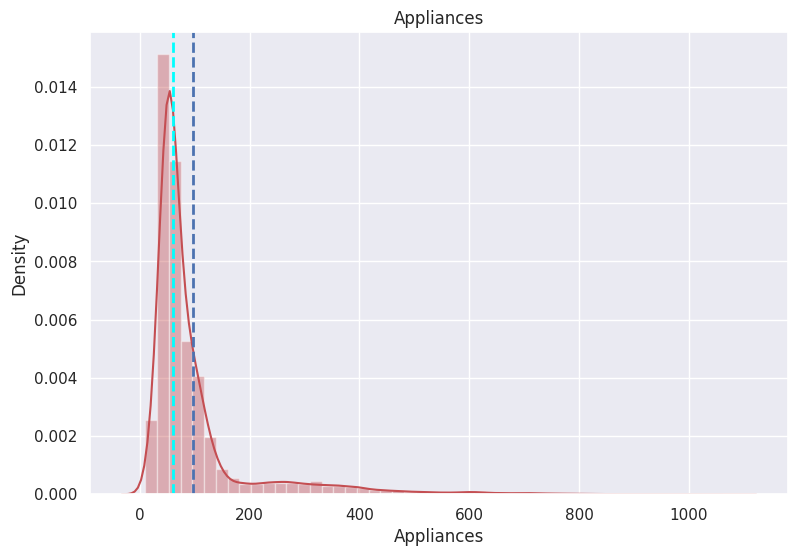

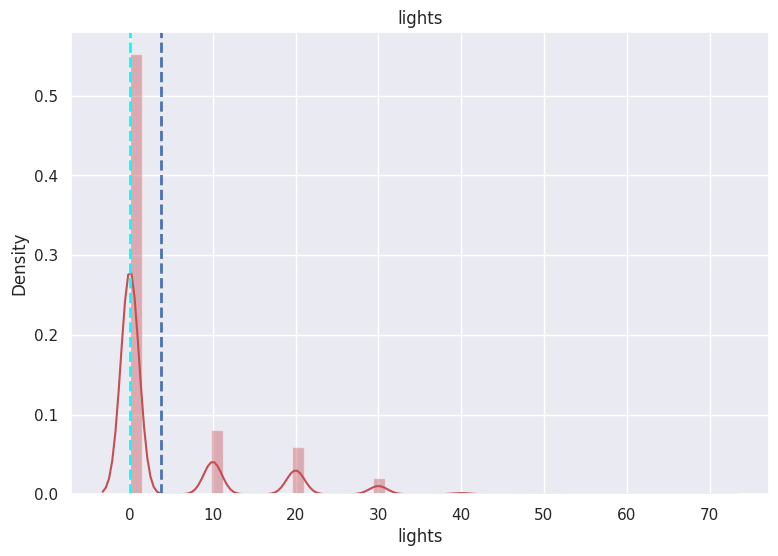

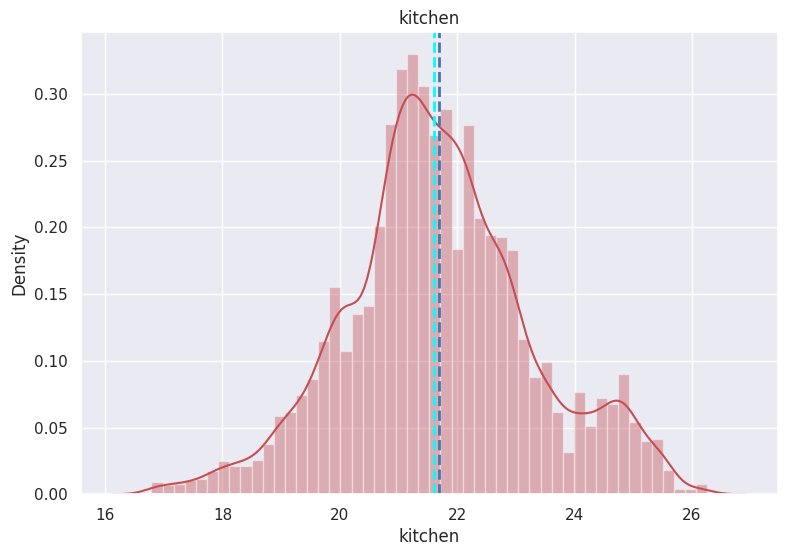

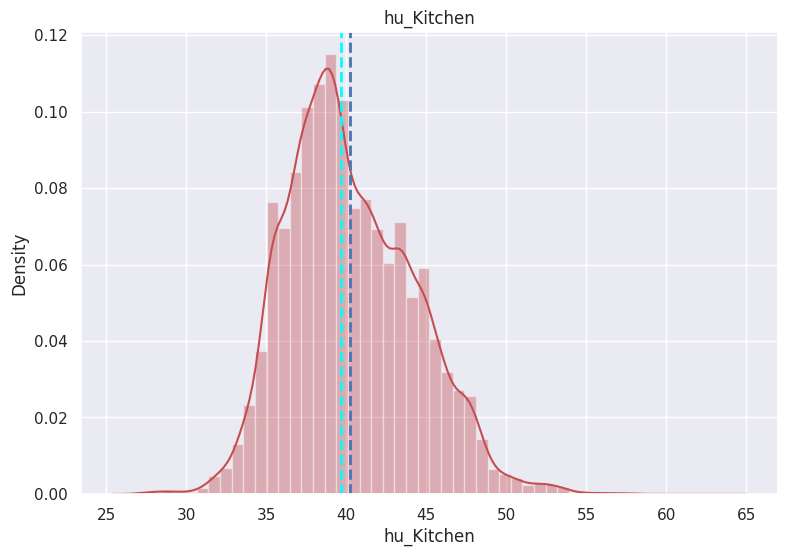

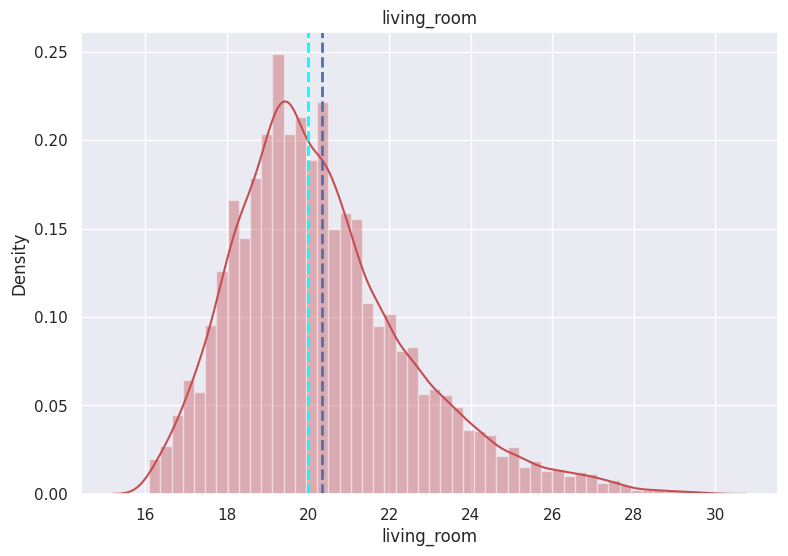

...

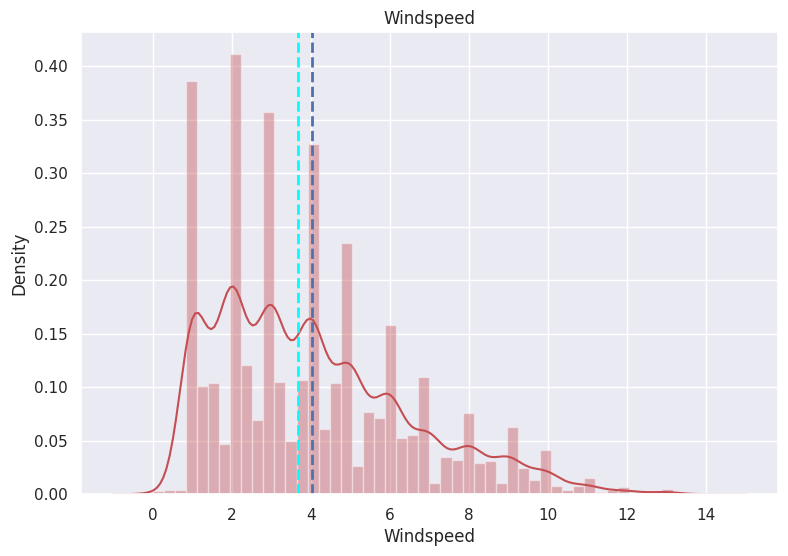

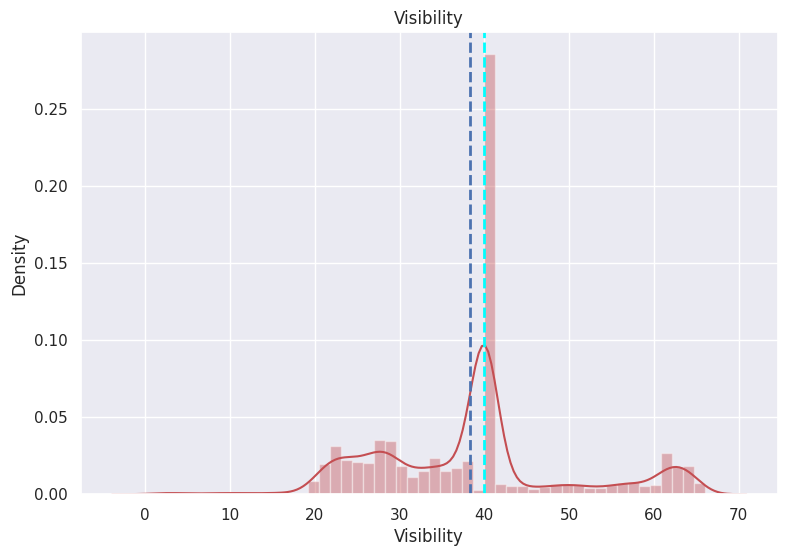

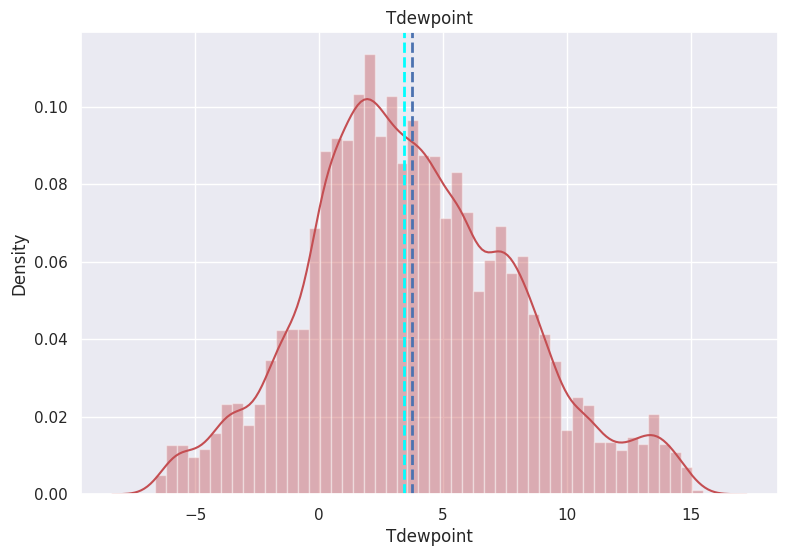

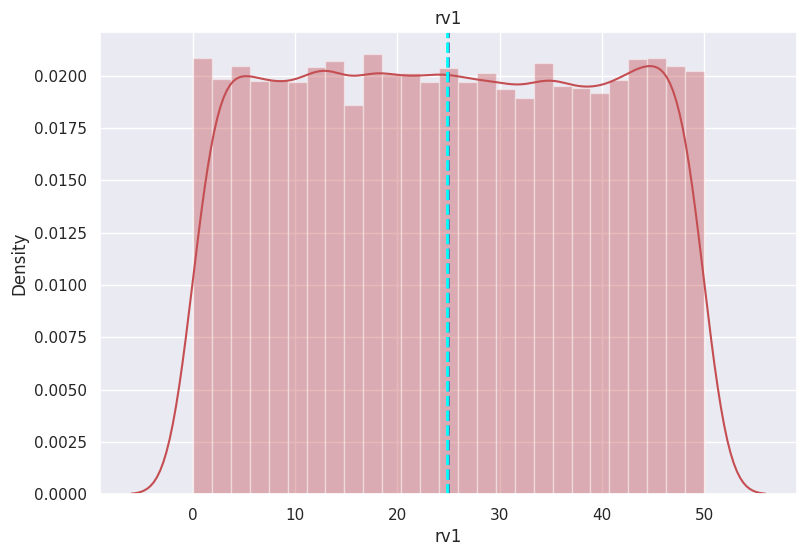

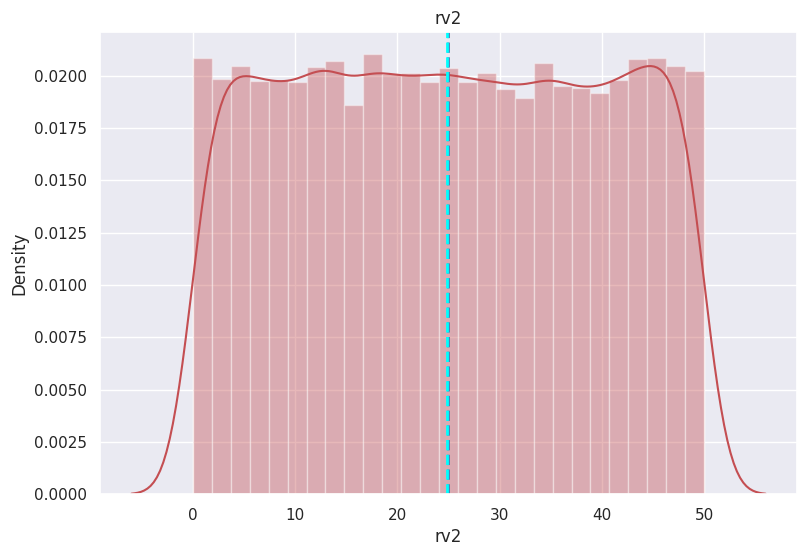

In [ ]:

# Chart - 1 visualization code
for i in mean['features']:
  
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (df[i])
  sns.distplot(df[i],color = 'r')
  ax.axvline(feature.mean(),color='b', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(i)
 
  plt.show()

##### 1. Why did you pick the specific chart?

 **To check the distribution of the features, seaborn's distplot is the best choice.**

##### 2. What is/are the insight(s) found from the chart?

**From the plot it has been found out that, some features are nearly normally distributed but some are filled with skewedness.**

**Appliances,Lights,visibility and Windspeed are filled with skewdness, hence applying the transformation is required for them.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

**The insights will help to build the more accurate ML model.**

#### Chart - 2

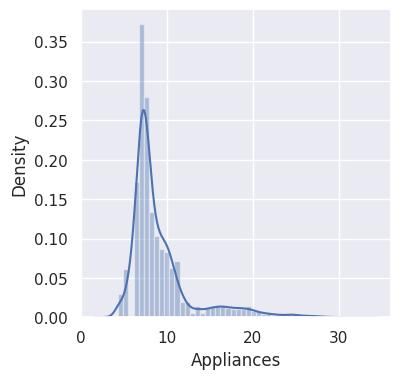

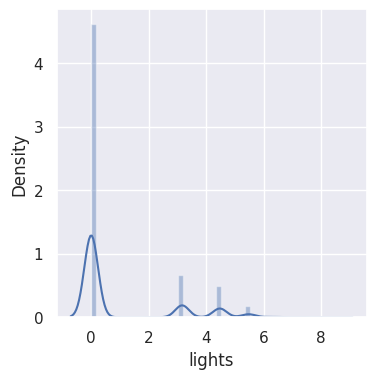

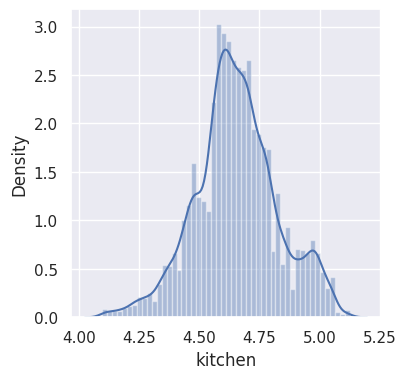

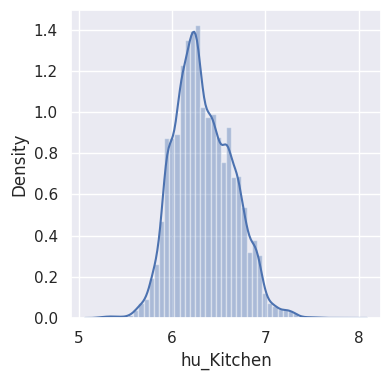

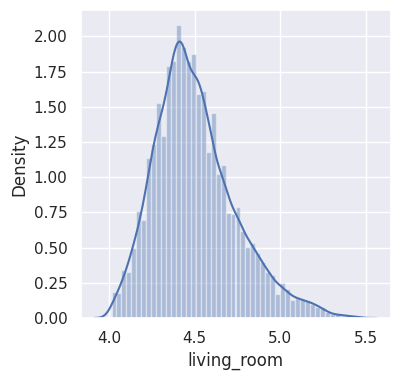

...

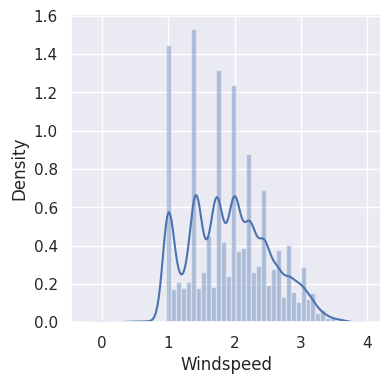

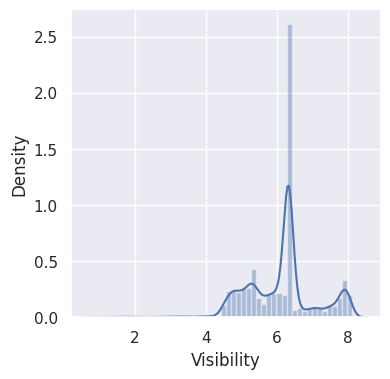

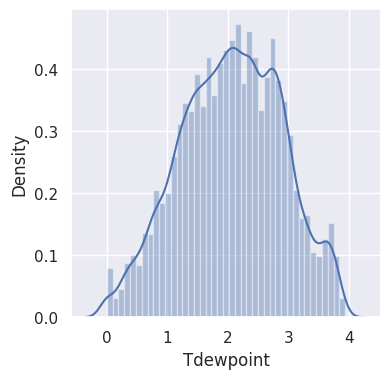

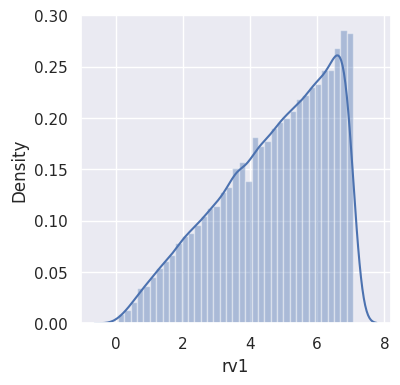

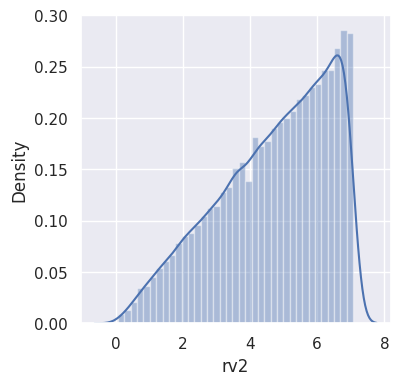

In [ ]:
# Chart - 2 visualization code
for i in mean['features']:
  sns.distplot(np.sqrt(df[i]),color='b')
  plt.show()

##### 1. Why did you pick the specific chart?

In this chart transformation have been applied to move the features towards more normally distributed.

##### 2. What is/are the insight(s) found from the chart?

Applying the transformation have reduced the skewedness in the features.

More specifically due to uncompatibility of feature lights with log transformation I have used the sqaure root transformation.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Square root transformation have reduced the skewedness and helped to buil more accurate regression model.

#### Chart - 3

In [ ]:
mean.iloc[21]

mean         755.522602
features    Press_mm_hg
Name: 21, dtype: object

In [ ]:
# Chart - 3 visualization code
mean1=mean.copy().drop(21)
mean1

,mean,features
0,97.694958,Appliances
1,3.801875,lights
2,21.686571,kitchen
3,40.259739,hu_Kitchen
4,20.341219,living_room
5,40.42042,hu_living
6,22.267611,Laundry_room
7,39.2425,hu_laundry
8,20.855335,office_room
9,39.026904,hu_office


In [ ]:
!pip install plotly.express
import plotly.express as px

fig = px.bar(mean1, x='features', y='mean',color='features')
fig.update_layout(width=1000,height=600)
fig.show()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##### 1. Why did you pick the specific chart?

**Bar chart help to understand the trends of multiple feature at once.**

##### 2. What is/are the insight(s) found from the chart?

**From the visualizaton graph, we can estimate the on an average range of temperature and humidity for all the features.**

**In addition with it, other features like atmospheric pressure ,windspeed, tdewpoint also shows the average normal values.For e.g the mean of atmospheric pressure is near about 756 atm, which is approximately equivalent to the noraml atmospheric pressure which is 760 atm.**

**The datapoint showing the value for mean atm. pressure has been removed while plotting the bar chart because it is too high. Hence the plot was imbalanced and hence for simplicity of graph it has been removed.**

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

**It helps in understanding the standard normal values of all the features.**

#### Chart - 4

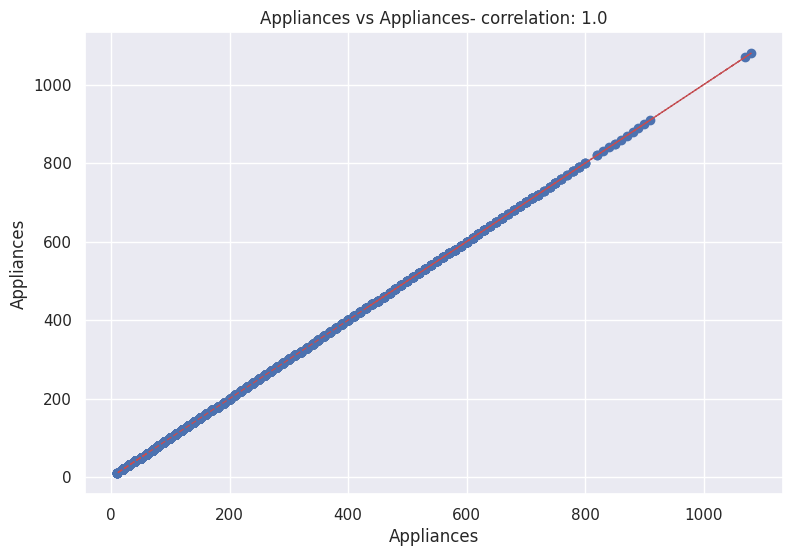

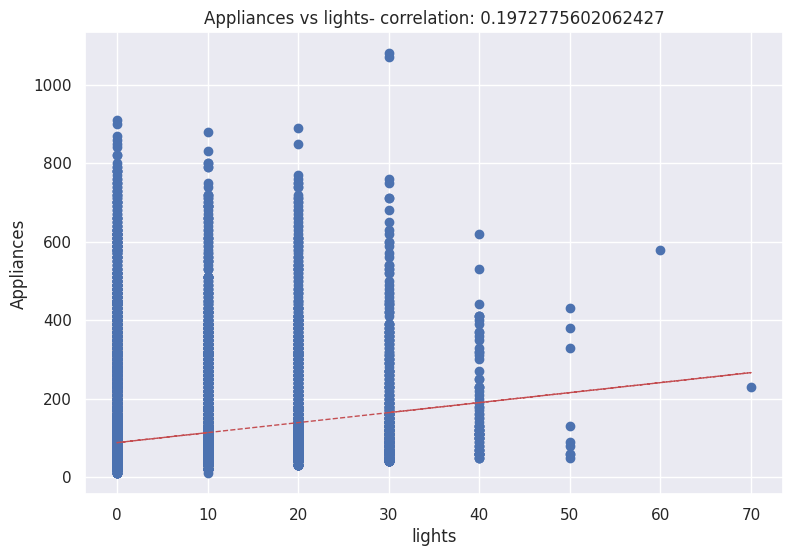

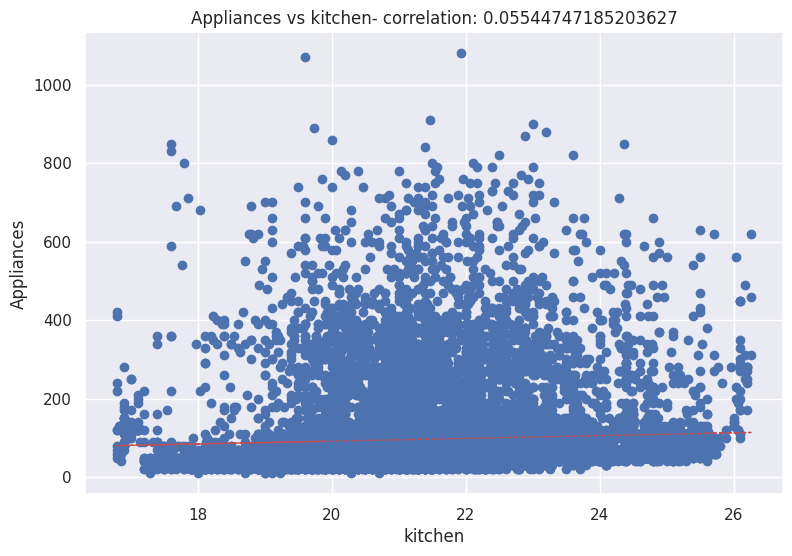

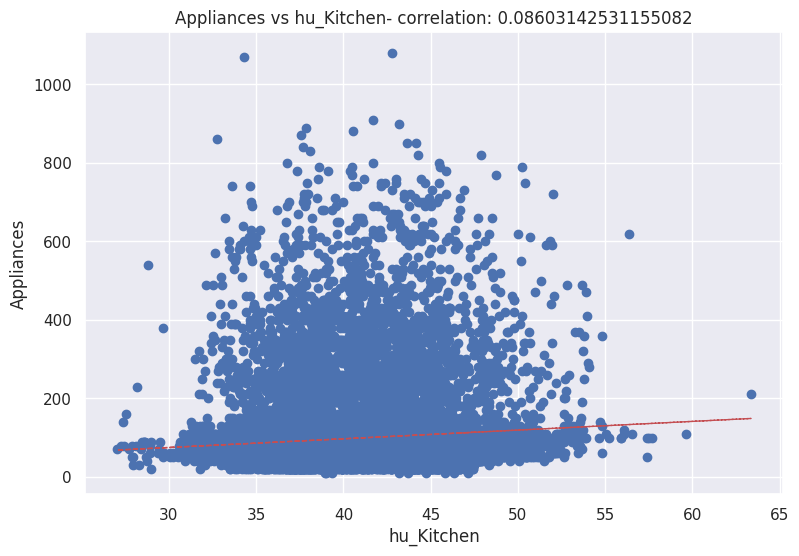

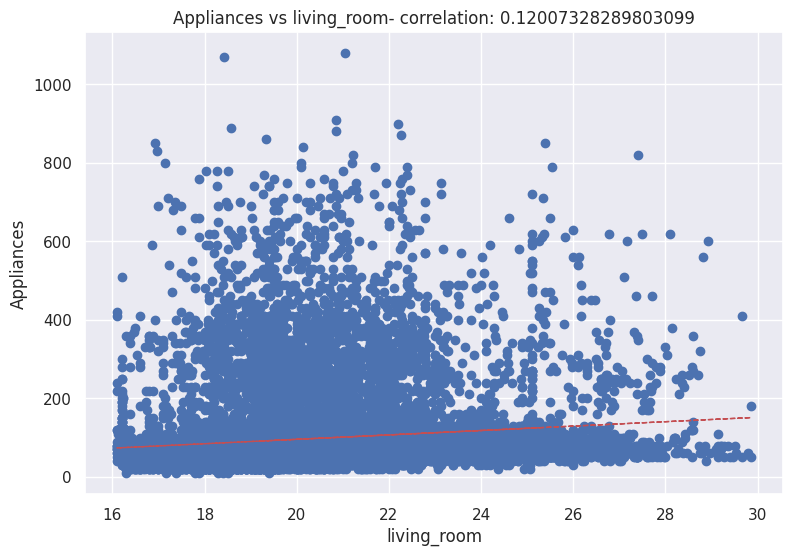

...

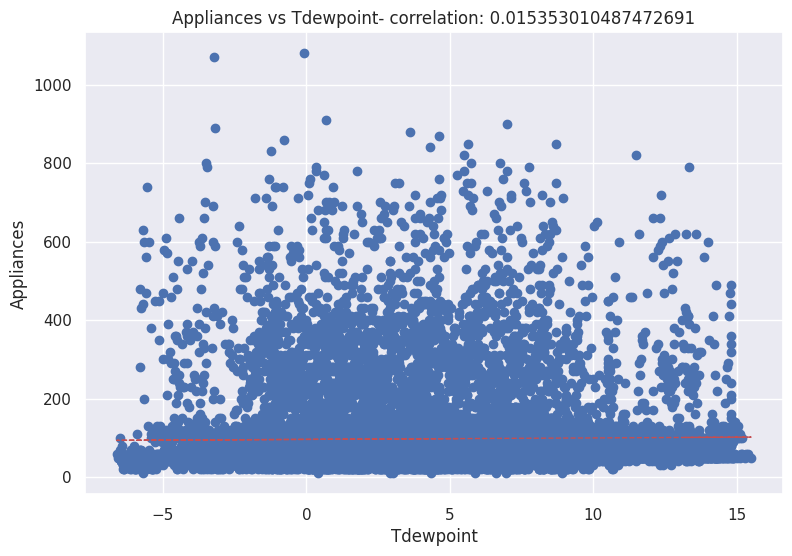

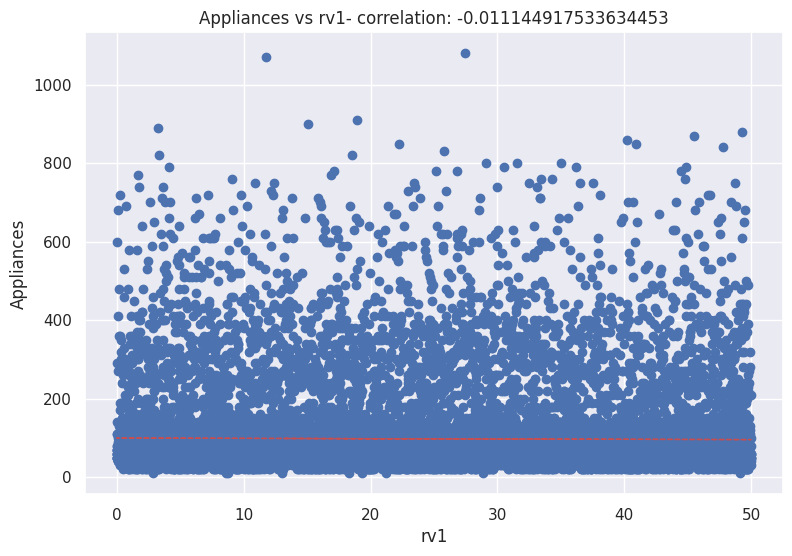

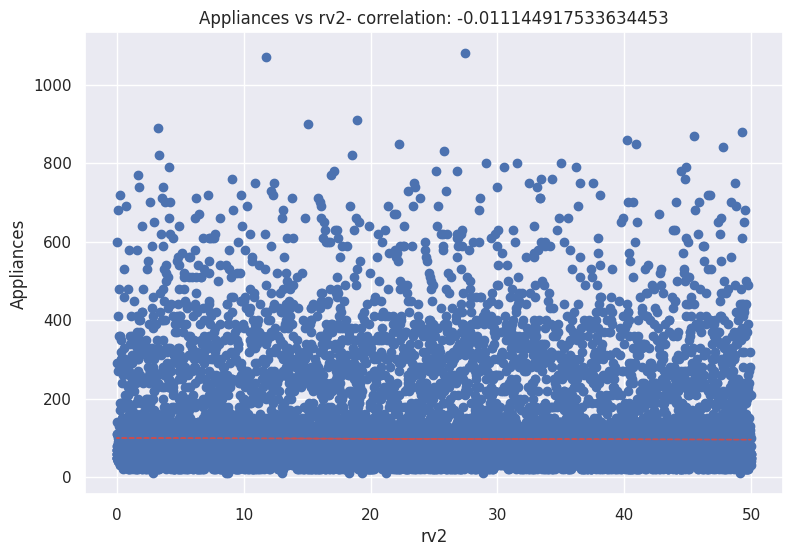

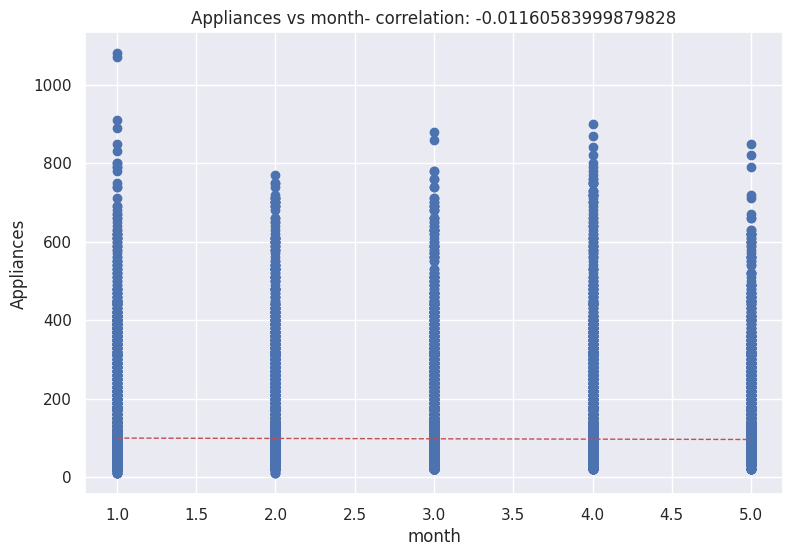

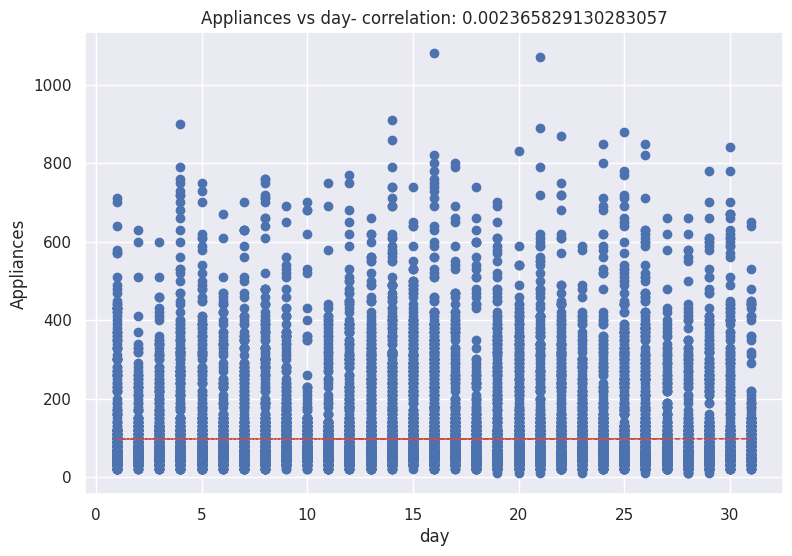

In [ ]:
# Chart - 4 visualization code
for col in num_feats[1:]:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    feature = df[col]
    label = df['Appliances']
    correlation = feature.corr(label)
    plt.scatter(x=feature, y=label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df[col], df['Appliances'], 1)
    y_hat = np.poly1d(z)(df[col])

    plt.plot(df[col], y_hat, "r--", lw=1)

plt.show()

##### 1. Why did you pick the specific chart?

**In the above plot, I have plotted evry feature with the target variable.**

**Here, the features are plotted against the 'Appliances' column. bold text**

##### 2. What is/are the insight(s) found from the chart?

**The graphs shows, arrangement of some features and appliances are very much neutral and purely scattered. But the Lights column is showing somewhat relationship with the target variable.**

**Otherwise the arrangement of scatterpoints are compatible for regression analysis as it do not show any specific arrangement with the target variable.**

#### Chart - 5

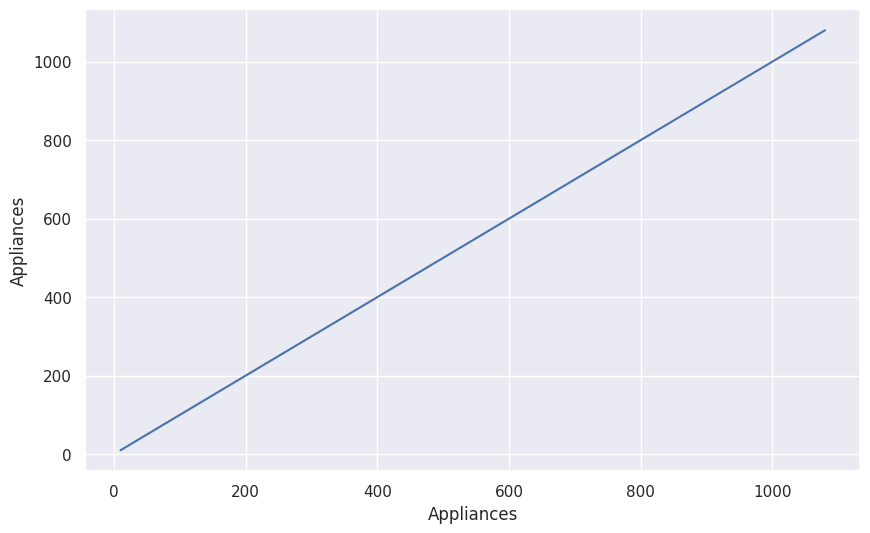

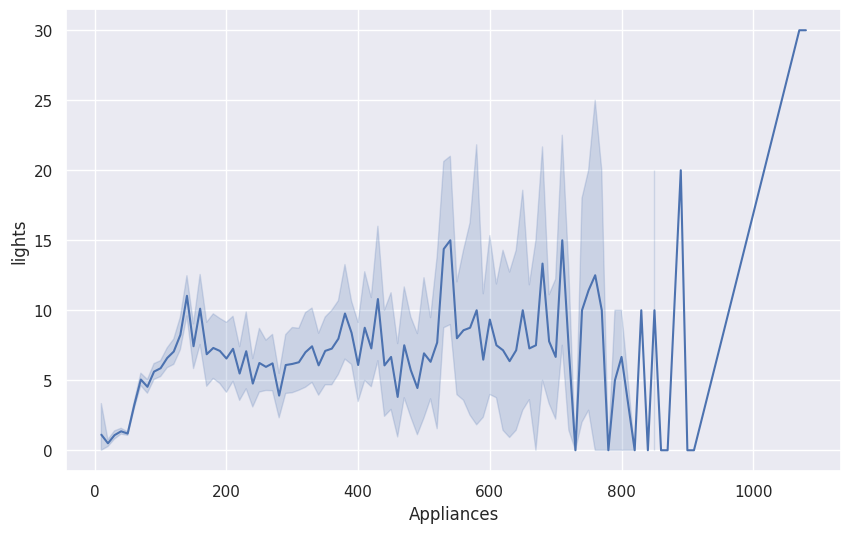

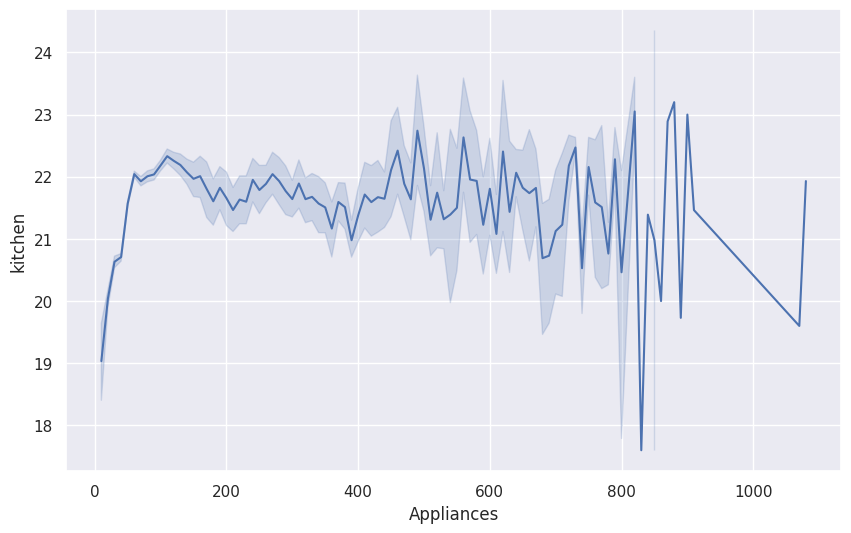

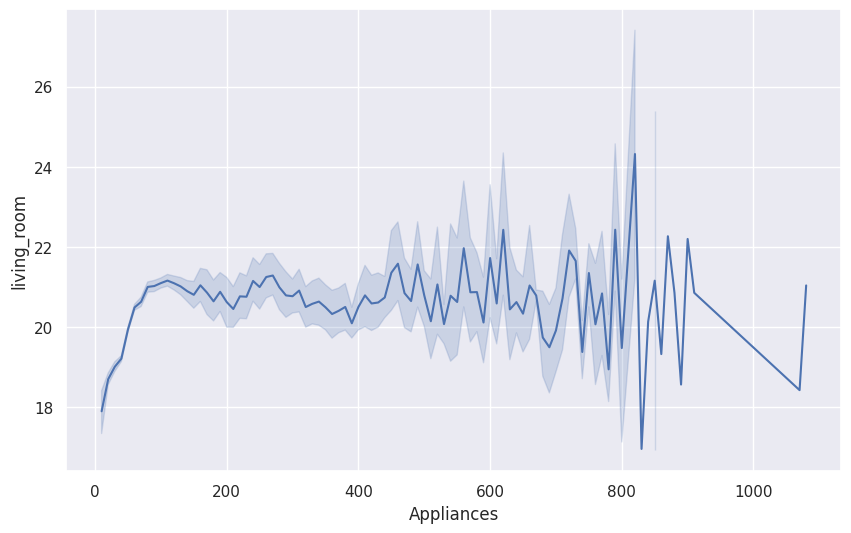

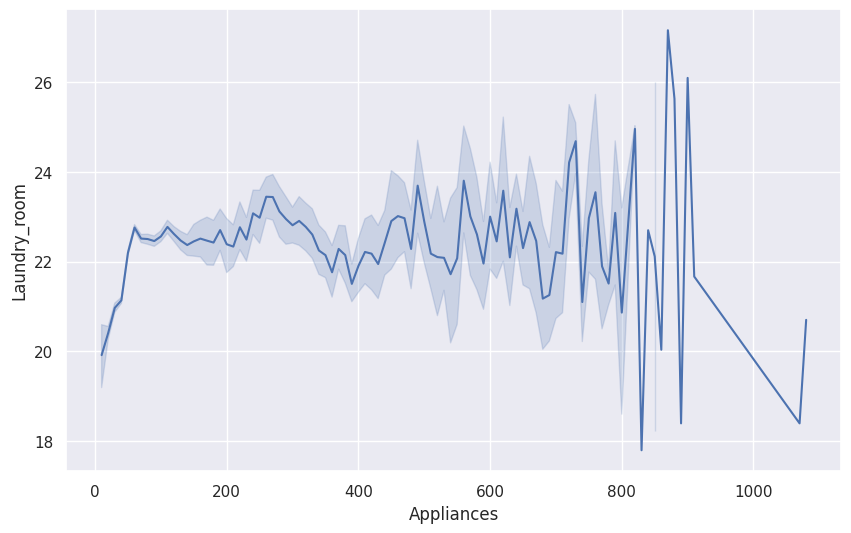

...

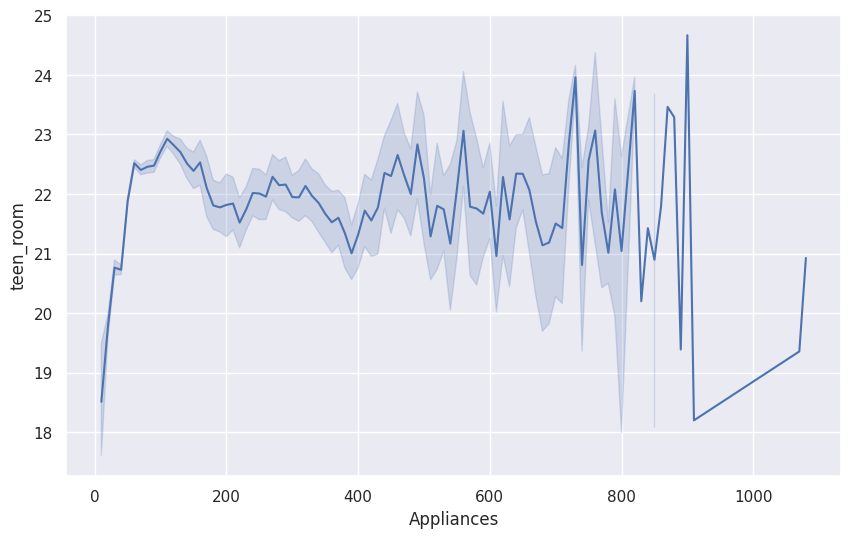

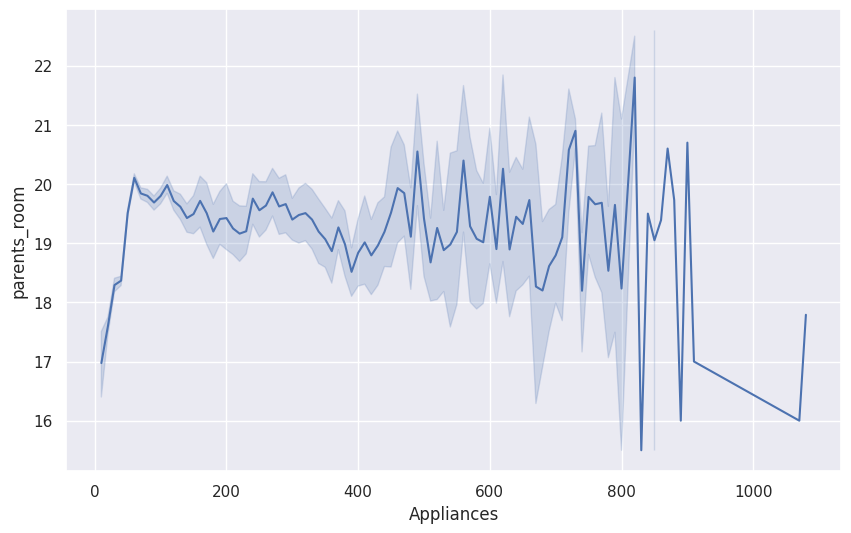

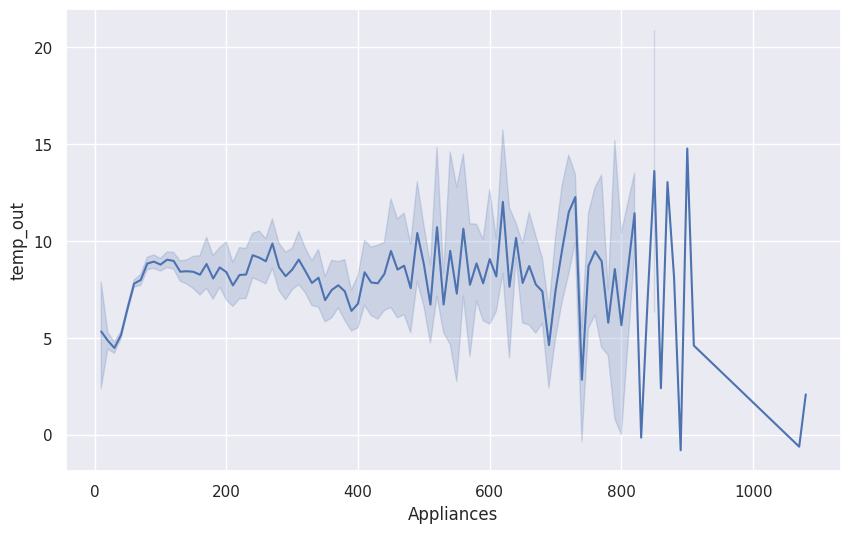

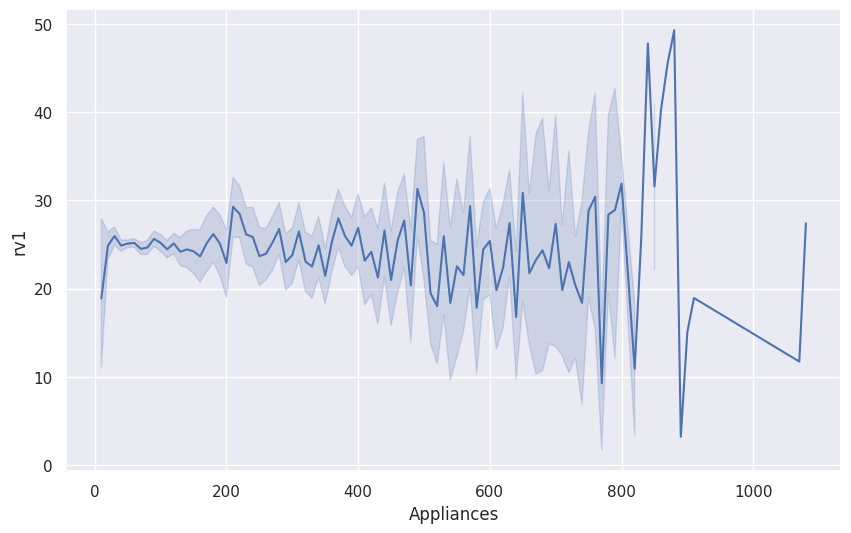

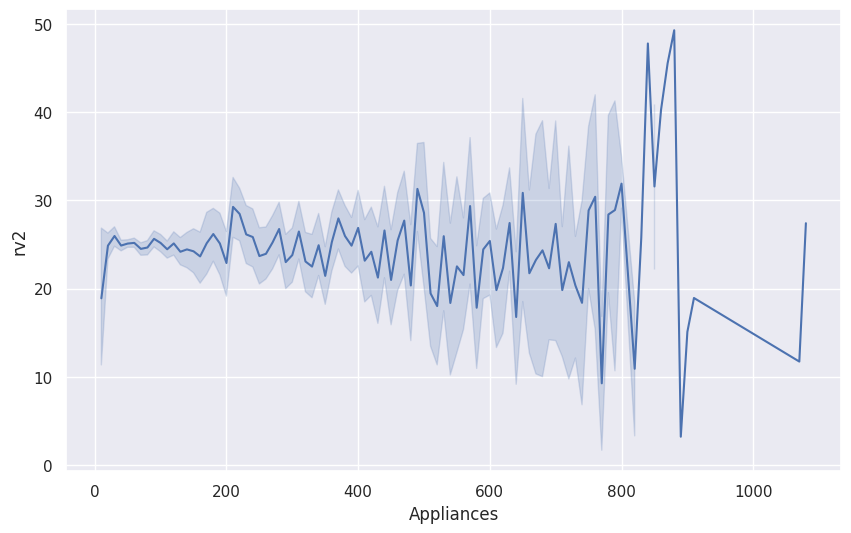

<Figure size 1000x600 with 0 Axes>

In [ ]:
# Chart - 5 visualization code
plt.figure(figsize=(10,6))
for i in temp_df:
  sns.lineplot(x='Appliances', y=i,
             
             data=temp_df)
  
  plt.show()
  plt.figure(figsize=(10,6))

Now this graph is showing the same kind of trends. But this visualization is helping us for collecting information only for humidity related features.

#### Chart - 6

**Extract weekdays,Month from date columns.**

In [ ]:
df["date"]=df["date"].astype("datetime64")

In [ ]:
# extract weekday from date column

df["weekday"]=df["date"].dt.weekday

Text(0, 0.5, 'Appliances (Wh)')

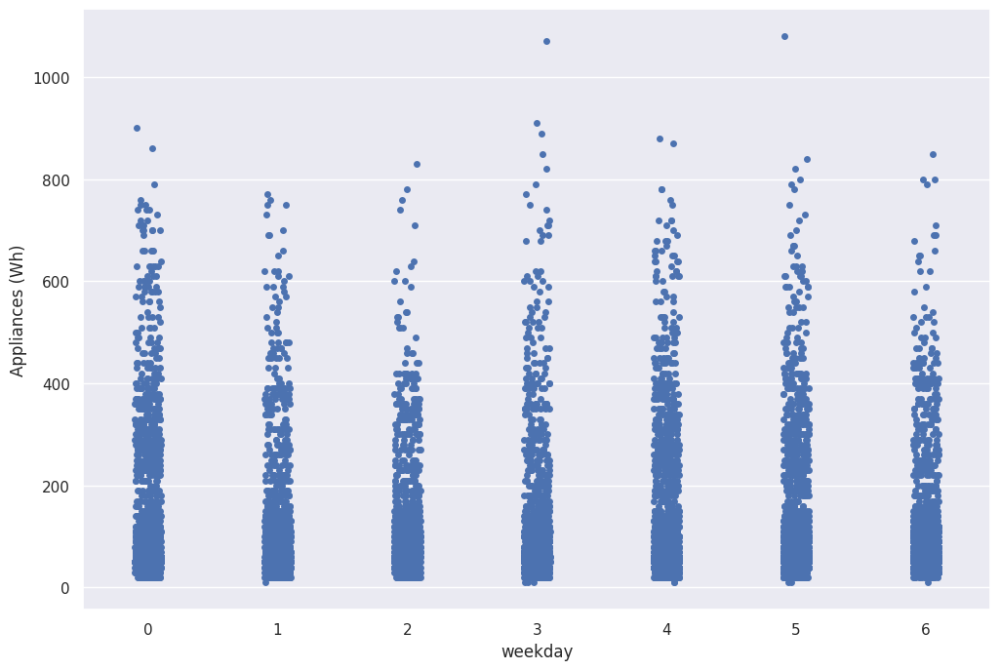

In [ ]:
# strip plot of Appliances(Wh) vs weekday

plt.figure(figsize=(12,8))
sns.stripplot(x="weekday",y="Appliances",data=df,color="b")
plt.xlabel("weekday",size=12)
plt.ylabel("Appliances (Wh)",size=12)

**extract month from date column**

In [ ]:
df["month"]=df["date"].dt.month

Text(0, 0.5, 'Appliances (Wh)')

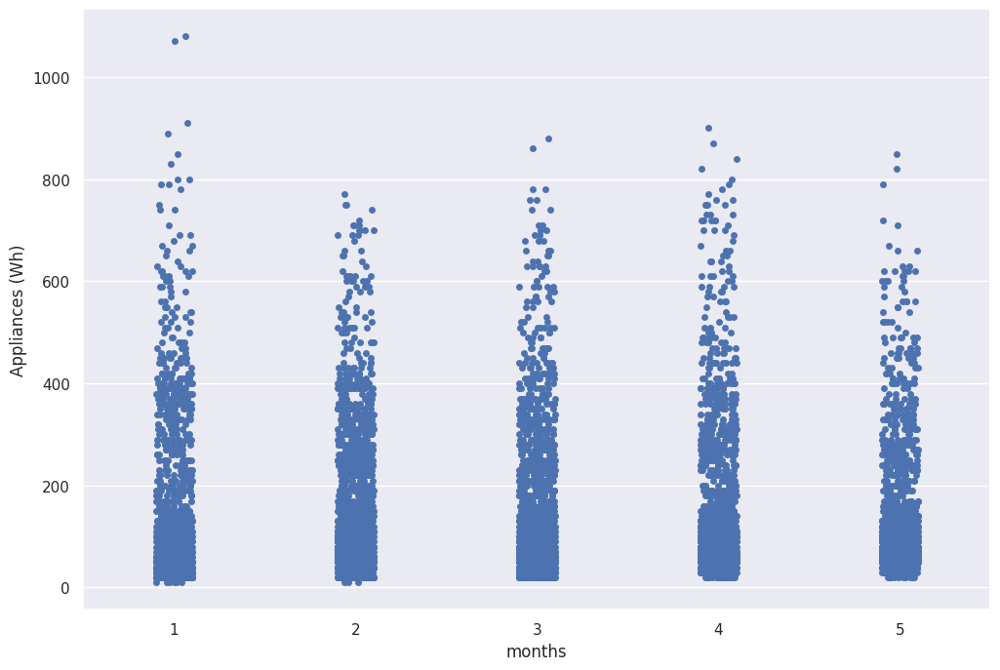

In [ ]:
# strip plot of Appliances(Wh) vs Month

plt.figure(figsize=(12,8))
sns.stripplot(x="month",y="Appliances",data=df)
plt.xlabel("months",size=12)
plt.ylabel("Appliances (Wh)",size=12)

##### 1. Why did you pick the specific chart?

It displays small, simple graphs in a strip to help you trace causality quickly by showing the causes or uses of a variable. The strip graph plots a single variable on each graph of the strip and shows behavior for each loaded dataset.

##### 2. What is/are the insight(s) found from the chart?

As see in graph almost all the weedays from Monday to Friday has less energy consumption as compare to weekends and all the month from january to may has same energy consumption.

#### Chart - 7

In [ ]:
day_df

,month_name,day,Appliances
0,April,1,8580
1,April,2,7300
2,April,3,10340
3,April,4,27150
4,April,5,22300
...,...,...,...
133,May,23,11960
134,May,24,13850
135,May,25,12080
136,May,26,21170


In [ ]:
# Chart - 7 visualization code
fig = px.bar(day_df, x="day", y="Appliances",
             
             color="month_name",barmode="relative")
fig.update_layout(width=1000,height=600)
fig.show()

##### 1. Why did you pick a specific chart?

**it shows the colorful variation of all the days in five months.**

##### 2. What is/are the insight(s) found from the chart? 

**The month of April shows highest energy consumption on the 4th day of the month.**

**Whereas on 28th of january has minimum energy consumption by appliances.**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**By understanding the day wise energy consumption, the companies could understand the exact behavioural pattern of their consumers.**

#### Chart - 8

<Axes: >

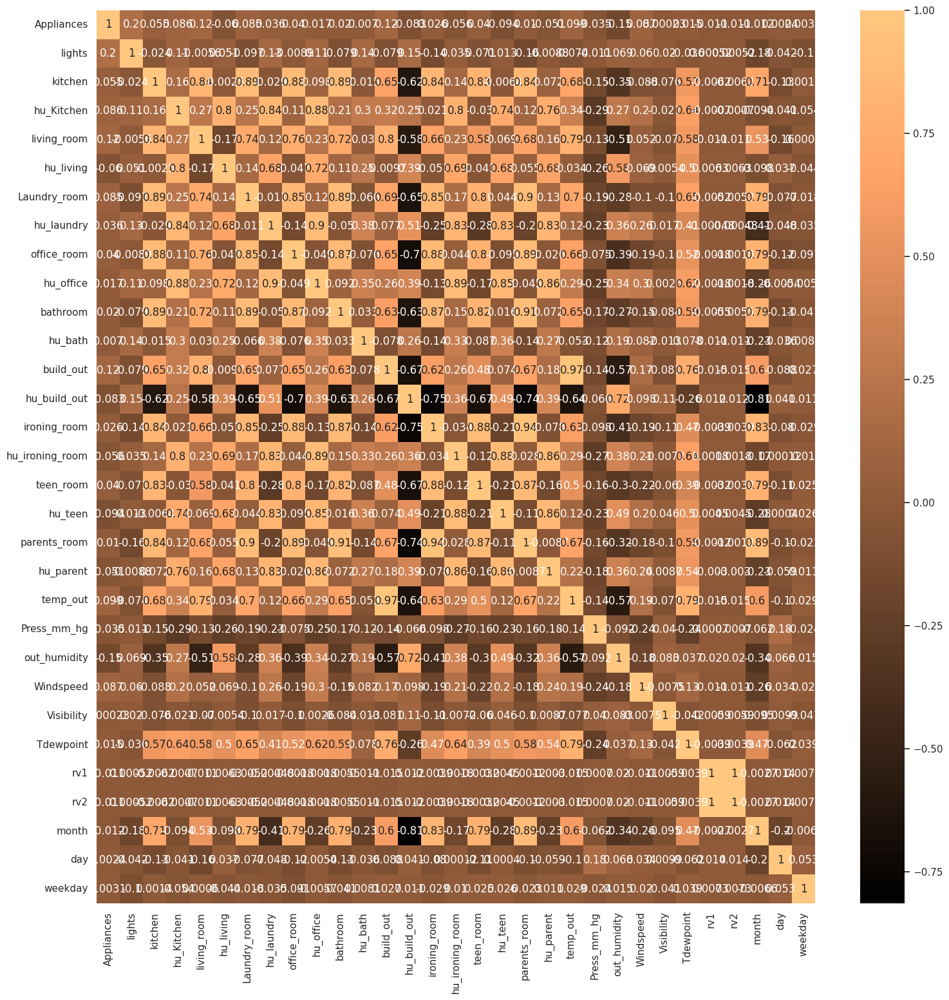

In [ ]:

# Chart - 8 Heatmap
fig, ax = plt.subplots(1,1,figsize=(18,18))
sns.heatmap(df.corr(),cmap='copper', ax=ax, annot=True)

##### 1. Why did you pick the specific chart?

A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses that is why I prefer to used correlatix matrix for better understanding of data

##### 2. What is/are the insight(s) found from the chart?

**Observations based on correlation plot:--**

Temperature — All the temperature variables from T1-T9 and T_out have positive correlation with the target Appliances . For the indoor temperatures, the correlations are high as expected, since the ventilation is driven by the HRV unit and minimizes air tempera-ture differences between rooms. Four columns have a high degree of correlation with T9 — T3,T5,T7,T8 also T6 & T_Out has high correlation (both temperatures from outside) . Hence T6 & T9 can be removed from training set as information provided by them can be provided by other fields.

Weather attributes — Visibility, Tdewpoint, Press_mm_hg have low correlation values

Humidity — There are no significantly high correlation cases (> 0.9) for humidity sensors.

Random variables have no role to play The random variables rv1, rv2 and Visibility, Tdewpoint, Press_mm_hg have low correlation with the target variable.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

A correlation matrix is a table which displays the correlation between variables. For example, it tells you whether a rise in fuel prices affects the rate of groceries. Once a relationship is ascertained, it helps businesses make business decisions accordingly

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

I want to check how much percentage of Appliances in this four months have consumed greater than the mean energy consumption.

So my Null hypothesis is 50 % or more of Appliances have consumed more than or equal to mean of total energy consumption.

Alternate Hypothesis is, Not more than 50% of Appliances consumed the greater energy than its mean.

P --> Proportions of Appliances
H0: P >= 50
HA: P <= 50

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Perform Statistical Test to obtain P-Value
''' For analysing the Null Hypothesis I am using the Proportion method.
    As the H0 is asking for 50% or more proportion of appliances energy consumption
    is more than its mean, we will require to extract a random sample and perform the testing.'''
    
'''first step, extracting the Dataset'''
appliance_rand= df['Appliances'].sample(1000) 

'''As we require to work on mean'''
appliance_rand_mean= appliance_rand.mean()
appliance_rand_mean

'''Now we require to find out the existing proportion in our random sample.
   Proportion of such entries where Appliances have consumed more energy than its mean'''

more_mean=[]
for i in appliance_rand:
  if i > appliance_rand_mean:
    more_mean.append(i)
P = (len(more_mean)/len(appliance_rand))
print(P)
'''Now this is the proportion of random sample, shows proportion of appliances where energy consumption is more than mean.'''
     

0.273


'Now this is the proportion of random sample, shows proportion of appliances where energy consumption is more than mean.'

In [ ]:

''' As our Null Hypothesis asking for 50% of entries, Our proportion for population will be 50'''

P_popu = 0.5   #proportion for population
N = len(appliance_rand)
Z_score = P-P_popu/np.sqrt(P*(1-P)/N)
print(f'Z_score is {Z_score}')

P_Value= norm.cdf(Z_score,0,1)
print(f'P_value is {P_Value}')

if P_Value > 0.05:
  print('Null Hypothesis can not be rejected as P_value is greater than significance level of 0.05 .')
else :
  print('Null Hypothesis can be rejected as P_value is lower than significance level of 0.05 .')

Z_score is -35.21826470497908
P_value is 5.252756012275743e-272
Null Hypothesis can be rejected as P_value is lower than significance level of 0.05 .


In [ ]:
#Cross evaluating the Null Hypothesis
'''Now if we calculate the proportion directly from our population then we could find the following results.'''

more_mean=[]
for i in df['Appliances']:
  if i > df['Appliances'].mean():
    more_mean.append(i)
P = (len(more_mean)/len(df['Appliances']))
print(P)
if P> 0.5 :
  print( 'The proportion of datapoints which consume more energy than its mean is more than 50%.')
else :
  print( 'The proportion of datapoints which consume more energy than its mean is less than 50%.')

0.2640486445401571
The proportion of datapoints which consume more energy than its mean is less than 50%.


##### Which statistical test have you done to obtain P-Value?

I have calculated the Z statistics for given proportion, and then find its P_value, by using normal cumulative distribution function with the mean and standard deviation of random sample.

The significance level is 0.05

##### Why did you choose the specific statistical test?

Z statistics gives the exact values for evealuating the hypothesis. It can be easily compared with its critical values.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

The second Hypothesis for Temperature in Kitchen.

Null Hypothesis says the mean temperature in kitchen is greater than normal room temperature.

Alternate hypothesis says the temperature in Kitchen is at max room temperature and it can not be above it.

R --> Normal room temperature
T --> Mean of Kitchen temperature
H0: T > R
HA: T <= R

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Perform Statistical Test to obtain P-Value

''' For analysing the Null Hypothesis I am using the mean method.
    As the H0 is asking, whether the mean temperature of kitchen is more than 
    Normal room temperature or not, we will perform the test on random samples.
    As the samples should be random always I am not using seed here. So the hypothesis could
    evaluate different samples everytime.'''
    
'''first step, extracting the Dataset'''
kitchen_rand= df['kitchen'].sample(1000) 

'''As we require to work on mean'''
kitchen_rand_mean= kitchen_rand.mean()
print(kitchen_rand_mean)
'''Following would be the mean of random samples.'''

21.693099854978353


'Following would be the mean of random samples.'

In [ ]:
''' The mean and Normal room temperature has to be tested via Z_statistic'''

NRT = 20 #Normal room temperature

std_popu = df['kitchen'].std()# the standard deviation for population

deno= std_popu/np.sqrt(1000)  # This is the denominator part of final formula. I calculated here for easy execution.

Z_stat = ((kitchen_rand_mean - NRT)/(std_popu/np.sqrt(N)))
print(f'Z_score is {Z_stat} ')

P_value2=norm.cdf(Z_stat,0,1)
print(f'P_value is {P_value2} ')

if P_value2 > 0.05:
  print('The Null Hypothesis can not be rejected')
else:
  print('The Null Hypohesis can be rejected')

Z_score is 33.33644465355939 
P_value is 1.0 
The Null Hypothesis can not be rejected


##### Which statistical test have you done to obtain P-Value?

I have calculated the Z statistics for given proportion, and then find its P_value, by using normal cumulative distribution function with the mean and standard deviation of random sample.

The significance level is 0.05

##### Why did you choose the specific statistical test?

Z statistics gives the exact values for evealuating the hypothesis. It can be easily compared with its critical values.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

date               0
Appliances         0
lights             0
kitchen            0
hu_Kitchen         0
living_room        0
hu_living          0
Laundry_room       0
hu_laundry         0
office_room        0
hu_office          0
bathroom           0
hu_bath            0
build_out          0
hu_build_out       0
ironing_room       0
hu_ironing_room    0
teen_room          0
hu_teen            0
parents_room       0
hu_parent          0
temp_out           0
Press_mm_hg        0
out_humidity       0
Windspeed          0
Visibility         0
Tdewpoint          0
rv1                0
rv2                0
month              0
month_name         0
day                0
weekday            0
dtype: int64


<Axes: >

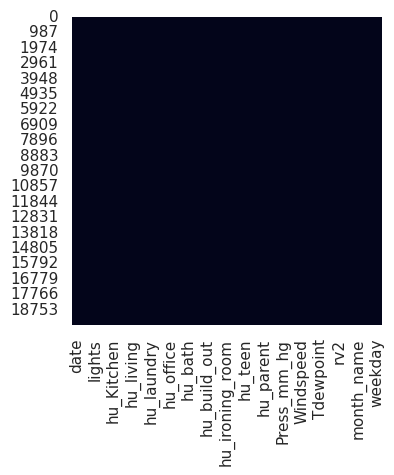

In [ ]:
# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(df.isnull().sum())

# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(df.isnull(), cbar=False)
     

#### What all missing value imputation techniques have you used and why did you use those techniques?

There are no missing values to handle in the given dataset.

### 2. Handling Outliers

In [ ]:
# Handling Outliers & Outlier treatments
columns=[i for i in df.columns if i not in ['date','month_name', 'weekday']]
columns
     

['Appliances',
 'lights',
 'kitchen',
 'hu_Kitchen',
 'living_room',
 'hu_living',
 'Laundry_room',
 'hu_laundry',
 'office_room',
 'hu_office',
 'bathroom',
 'hu_bath',
 'build_out',
 'hu_build_out',
 'ironing_room',
 'hu_ironing_room',
 'teen_room',
 'hu_teen',
 'parents_room',
 'hu_parent',
 'temp_out',
 'Press_mm_hg',
 'out_humidity',
 'Windspeed',
 'Visibility',
 'Tdewpoint',
 'rv1',
 'rv2',
 'month',
 'day']

In [ ]:
df.columns

Index(['date', 'Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'month', 'month_name', 'day', 'weekday'],
      dtype='object')

In [ ]:
# Handling Outliers & Outlier treatments
first_df= df[columns].apply(zscore)
first_df

,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,hu_office,...,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,day
0,-0.367676,3.301264,-1.118645,1.843821,-0.520411,1.073683,-1.235063,1.686130,-0.908217,1.506438,...,-0.152647,-2.976328,0.822080,1.207694,2.091596,0.366975,-0.807974,-0.807974,-1.569369,-0.598455
1,-0.367676,3.301264,-1.118645,1.616807,-0.520411,1.057097,-1.235063,1.704566,-0.908217,1.604528,...,-0.174588,-2.962813,0.822080,1.071703,1.766584,0.343135,-0.440240,-0.440240,-1.569369,-0.598455
2,-0.465215,3.301264,-1.118645,1.517959,-0.520411,1.033550,-1.235063,1.748608,-0.944115,1.580918,...,-0.196529,-2.949298,0.822080,0.935713,1.441572,0.319294,0.252109,0.252109,-1.569369,-0.598455
3,-0.465215,4.561378,-1.118645,1.459321,-0.520411,1.024540,-1.235063,1.769092,-0.962063,1.542526,...,-0.218470,-2.935783,0.822080,0.799723,1.116559,0.295454,1.408801,1.408801,-1.569369,-0.598455
4,-0.367676,4.561378,-1.118645,1.526336,-0.520411,1.009797,-1.235063,1.769092,-0.962063,1.497991,...,-0.240411,-2.922268,0.822080,0.663733,0.791547,0.271613,-1.028122,-1.028122,-1.569369,-0.598455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,0.022483,-0.479080,2.415962,1.583299,2.530318,0.394449,2.458745,0.590209,1.882026,1.511812,...,2.881489,-0.043599,-1.616282,-0.288198,-1.243314,2.282163,1.249203,1.249203,1.417563,1.294861
19731,-0.075056,-0.479080,2.374452,1.568221,2.468301,0.407788,2.425512,0.608646,1.882026,1.511812,...,2.856414,-0.043599,-1.593912,-0.220203,-1.172659,2.274216,1.675942,1.675942,1.417563,1.294861
19732,1.680659,0.781035,2.374452,1.592514,2.411103,0.576982,2.383971,0.752037,1.882026,1.544061,...,2.831338,-0.043599,-1.571542,-0.152208,-1.102004,2.266269,0.290494,0.290494,1.417563,1.294861
19733,3.143756,0.781035,2.374452,1.691361,2.313256,0.642694,2.304213,0.629130,1.882026,1.557883,...,2.806263,-0.043599,-1.549171,-0.084213,-1.031349,2.258322,-1.287590,-1.287590,1.417563,1.294861


In [ ]:

for i in first_df.columns:
  for j in first_df[i]:
    if j > 3 or j < -3 :
      first_df[i].replace( j , np.nan , inplace = True) # Replacing the outliers with the null value makes their calling vey easy.

In [ ]:

for i in first_df.columns:
  Z=first_df[i].isnull().sum()
  print(f'the null values in {i} are {Z} ')

the null values in Appliances are 540 
the null values in lights are 647 
the null values in kitchen are 14 
the null values in hu_Kitchen are 109 
the null values in living_room are 206 
the null values in hu_living are 131 
the null values in Laundry_room are 54 
the null values in hu_laundry are 14 
the null values in office_room are 0 
the null values in hu_office are 0 
the null values in bathroom are 23 
the null values in hu_bath are 567 
the null values in build_out are 98 
the null values in hu_build_out are 0 
the null values in ironing_room are 0 
the null values in hu_ironing_room are 24 
the null values in teen_room are 0 
the null values in hu_teen are 7 
the null values in parents_room are 0 
the null values in hu_parent are 0 
the null values in temp_out are 93 
the null values in Press_mm_hg are 107 
the null values in out_humidity are 159 
the null values in Windspeed are 104 
the null values in Visibility are 37 
the null values in Tdewpoint are 0 
the null values in

The above piece of codes are first converting the dataframe values to zscore and then evaluting them in the range of -3 to +3.

If the value lies out of the range then the method would consider it as outlier.

After running the test, feature have ommitted large number of otliers.

In [ ]:
second_df = df[columns].copy()

In [ ]:

for i in second_df.columns:
  sort = df[i].sort_values()
  Q1 = np.percentile(sort , 25 , interpolation='midpoint')
  Q2 = np.percentile(sort , 50 , interpolation='midpoint')
  Q3 = np.percentile(sort , 75 , interpolation='midpoint')

  IQR = Q3 - Q1
  
  Lower_limit = Q1 - (1.5 * IQR)
  Upper_limit = Q3 + (1.5 * IQR)
  
  for j in df[i]:
    if ((j > Upper_limit) or (j < Lower_limit)) :
      second_df[i].replace( j , np.nan,inplace = True)

In [ ]:
for i in second_df.columns:
  Z=second_df[i].isnull().sum()
  print(f'the null values in {i} are {Z} ')

the null values in Appliances are 2138 
the null values in lights are 4483 
the null values in kitchen are 515 
the null values in hu_Kitchen are 146 
the null values in living_room are 546 
the null values in hu_living are 235 
the null values in Laundry_room are 217 
the null values in hu_laundry are 15 
the null values in office_room are 186 
the null values in hu_office are 0 
the null values in bathroom are 179 
the null values in hu_bath are 1330 
the null values in build_out are 515 
the null values in hu_build_out are 0 
the null values in ironing_room are 2 
the null values in hu_ironing_room are 42 
the null values in teen_room are 71 
the null values in hu_teen are 17 
the null values in parents_room are 0 
the null values in hu_parent are 21 
the null values in temp_out are 436 
the null values in Press_mm_hg are 219 
the null values in out_humidity are 239 
the null values in Windspeed are 214 
the null values in Visibility are 2522 
the null values in Tdewpoint are 10 
th

The above piece of codes are finding the various percentile of the individual feature and then calibarating it with its inter quartile range, to find out the outliers

Here also the outliers have reaplced by null values.So that they could again replace with their mean.

**Replacement of outliers cum null values by their mean.**

In [ ]:
fourth_df = second_df.copy()

In [ ]:
for i in mean['features']:
  mean_list = first_df[i].mean()
  fourth_df[i].replace( np.nan ,mean_list,inplace = True )

In [ ]:

fourth_df

,Appliances,lights,kitchen,hu_Kitchen,living_room,hu_living,Laundry_room,hu_laundry,office_room,hu_office,...,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,day
0,60.000000,-0.118632,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,...,6.600000,0.017637,92.000000,7.000000,0.005820,5.300000,13.275433,13.275433,1,11
1,60.000000,-0.118632,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,...,6.483333,0.017637,92.000000,6.666667,0.005820,5.200000,18.606195,18.606195,1,11
2,50.000000,-0.118632,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,...,6.366667,0.017637,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668,1,11
3,50.000000,-0.118632,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,...,6.250000,0.017637,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389,1,11
4,60.000000,-0.118632,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,...,6.133333,0.017637,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,100.000000,0.000000,0.002158,46.560000,-0.035769,42.025714,-0.008708,41.163333,24.700000,45.590000,...,-0.015266,755.200000,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812,5,27
19731,90.000000,0.000000,0.002158,46.500000,-0.035769,42.080000,-0.008708,41.223333,24.700000,45.590000,...,-0.015266,755.200000,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940,5,27
19732,-0.123011,-0.118632,0.002158,46.596667,-0.035769,42.768571,-0.008708,41.690000,24.700000,45.730000,...,-0.015266,755.200000,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117,5,27
19733,-0.123011,-0.118632,0.002158,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,...,-0.015266,755.200000,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784,5,27


### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:

# Manipulate Features to minimize feature correlation and create new features
fourth_df.columns

Index(['Appliances', 'lights', 'kitchen', 'hu_Kitchen', 'living_room',
       'hu_living', 'Laundry_room', 'hu_laundry', 'office_room', 'hu_office',
       'bathroom', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room',
       'hu_ironing_room', 'teen_room', 'hu_teen', 'parents_room', 'hu_parent',
       'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'month', 'day'],
      dtype='object')

<Axes: >

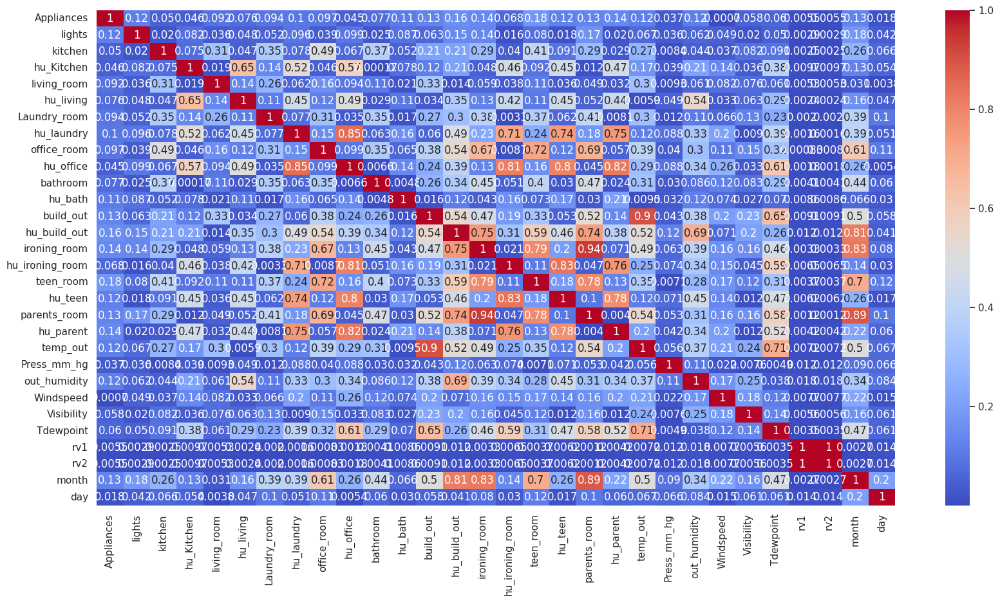

In [ ]:
plt.figure(figsize= ( 20 , 10))
correlation = fourth_df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting
# Select your features wisely to avoid overfitting
independent_variable =[i for i in fourth_df.columns if i not in ['Appliances']]
dependent_variable = 'Appliances'

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

Yes, following code gives a list of features which are skew symmetric and not balanced.

In [ ]:

# Transform Your data
symmetric_col=[]
skew_symmetric=[]
for i in fourth_df.columns:
  if abs(fourth_df[i].mean() - fourth_df[i].median()) > 0.1:
    skew_symmetric.append(i)
  else:
    symmetric_col.append(i)

print(f'Syemmetric columns are {symmetric_col} ')
print(f'skew_symmetric columns are {skew_symmetric} ')

Syemmetric columns are ['Appliances', 'lights', 'office_room', 'bathroom', 'parents_room', 'rv1', 'rv2', 'day'] 
skew_symmetric columns are ['kitchen', 'hu_Kitchen', 'living_room', 'hu_living', 'Laundry_room', 'hu_laundry', 'hu_office', 'hu_bath', 'build_out', 'hu_build_out', 'ironing_room', 'hu_ironing_room', 'teen_room', 'hu_teen', 'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed', 'Visibility', 'Tdewpoint', 'month'] 


[]

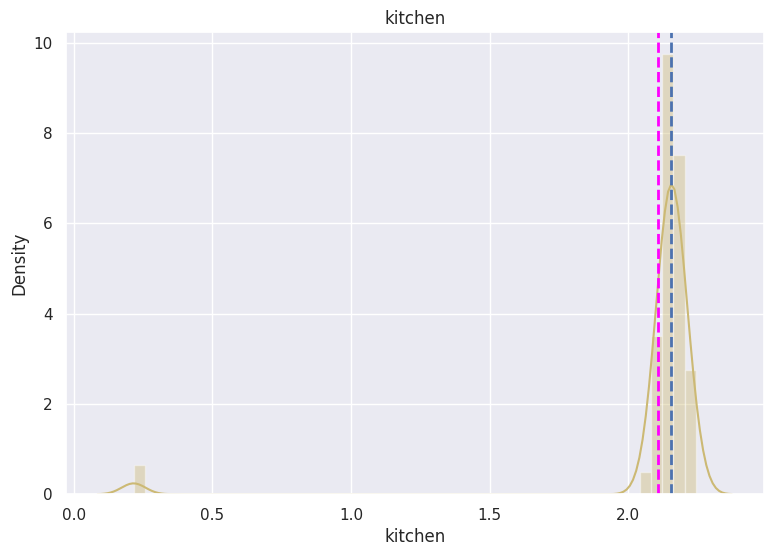

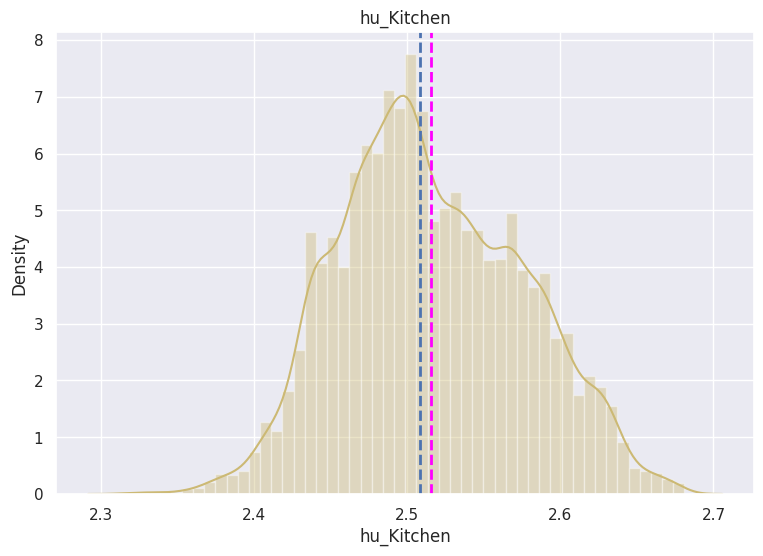

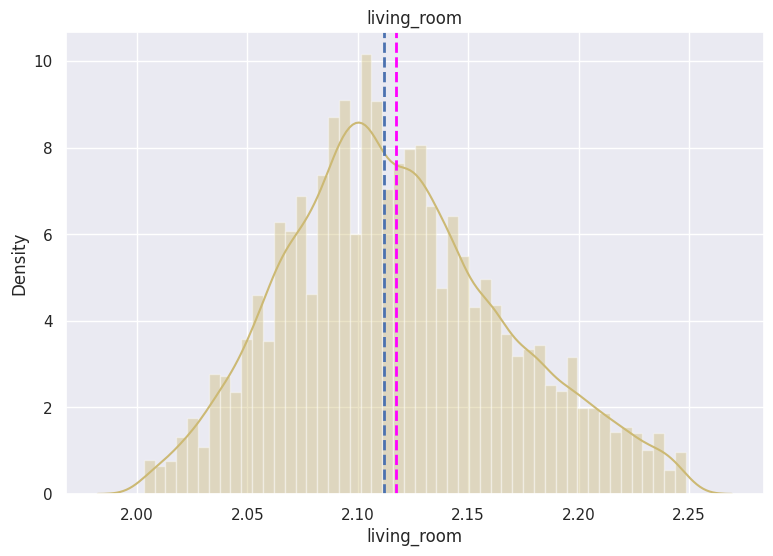

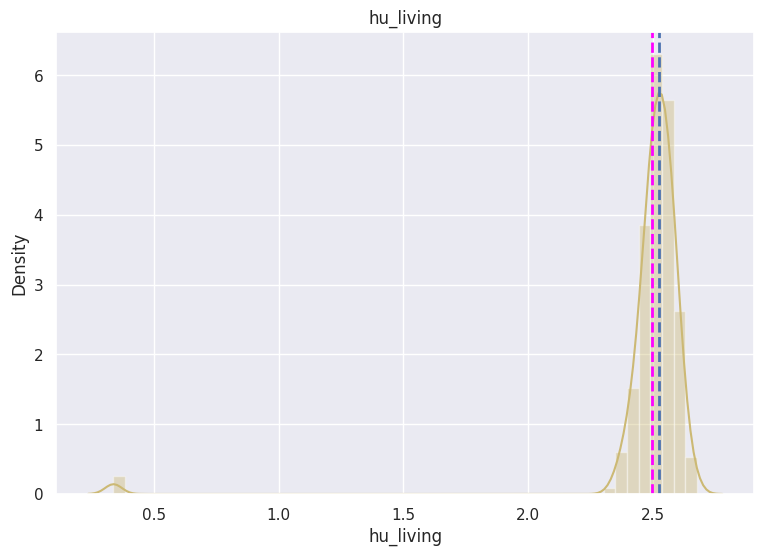

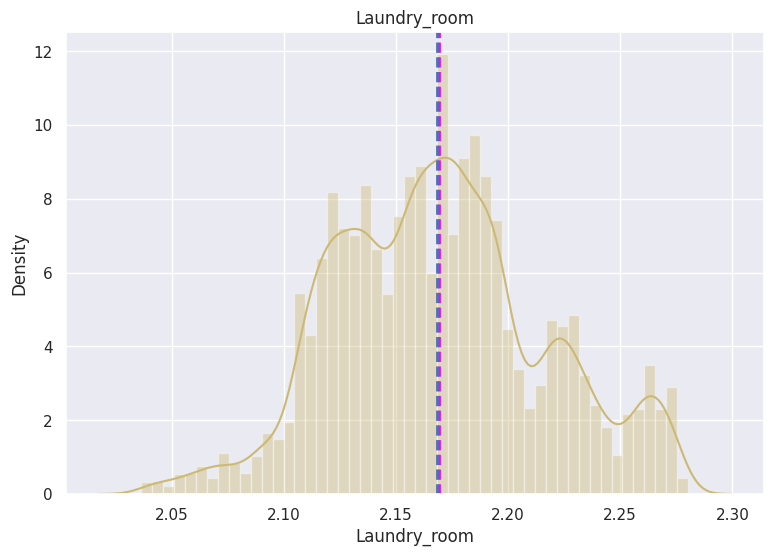

...

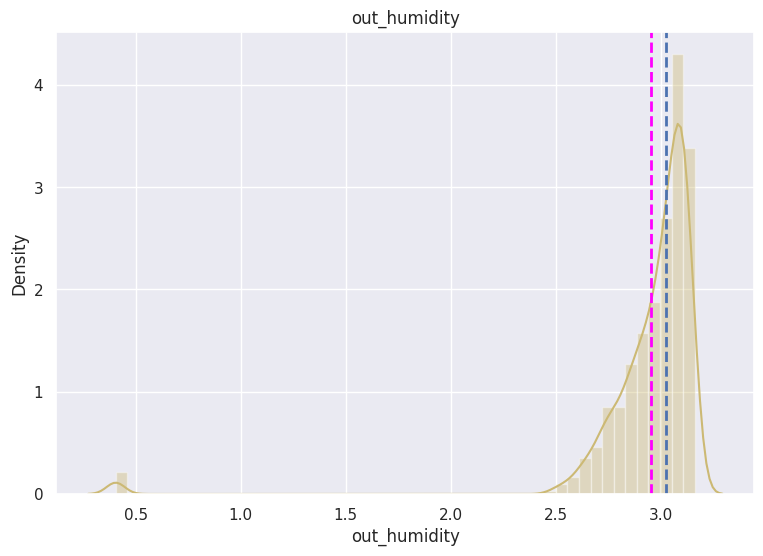

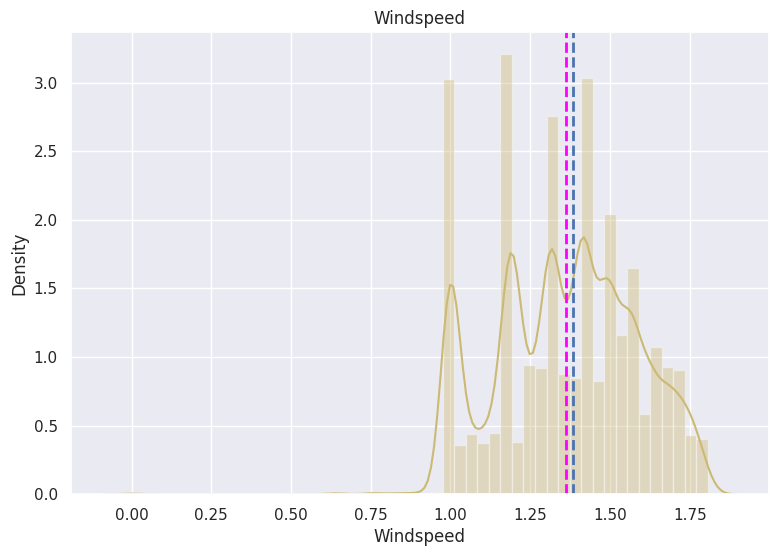

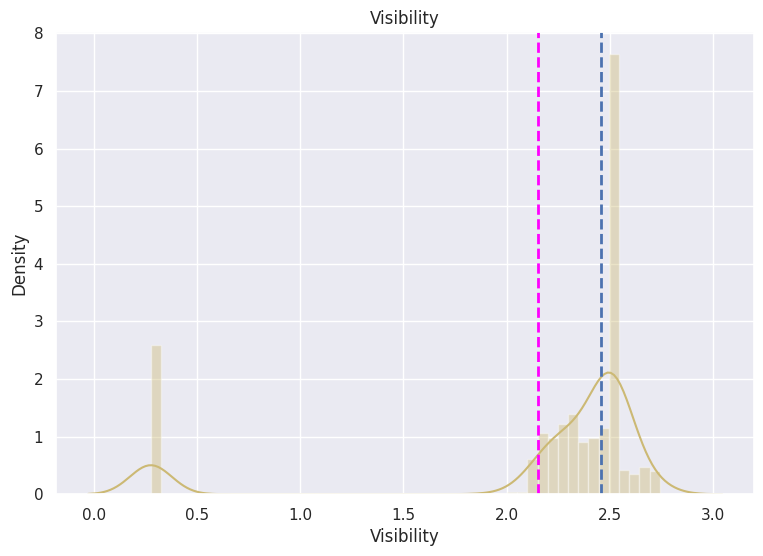

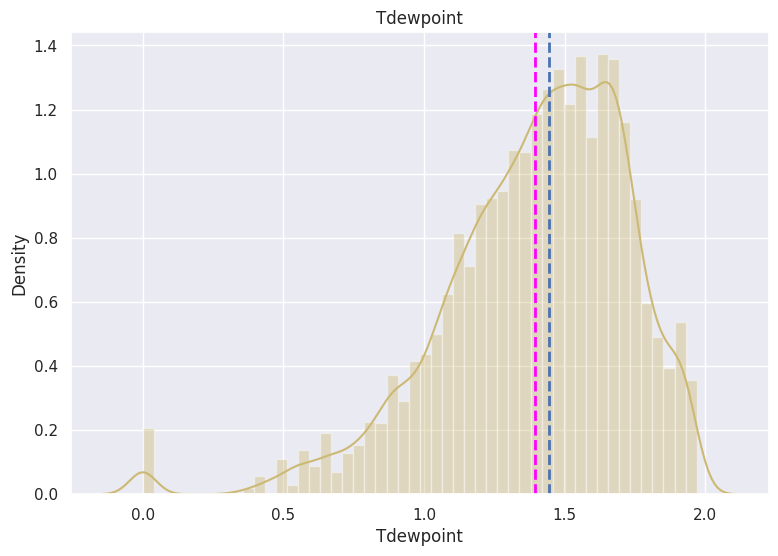

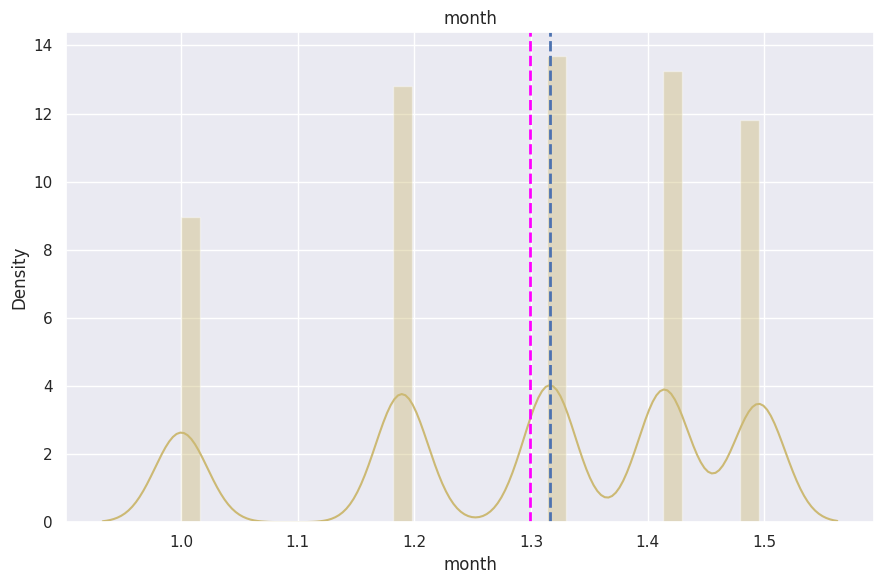

In [ ]:
# ploting the distribution plot for all the skew-symmetric features

for i in fourth_df[skew_symmetric].columns:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (fourth_df[i])**0.25
  sns.distplot(feature,color='y')
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='b', linestyle='dashed', linewidth=2)
  ax.set_title(i)
plt.tight_layout()
plt.plot()
     

### 6. Data Scaling

In [ ]:
# Scaling your data

##### Which method have you used to scale you data and why?

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.


In [ ]:
# DImensionality Reduction (If needed)


##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
model_df = pd.DataFrame(df,columns=fourth_df[independent_variable].columns)

X_train ,X_test,Y_train,Y_test = train_test_split(model_df.values,fourth_df[dependent_variable].values)
print(X_train.shape,X_test.shape)
print(Y_train.shape,Y_test.shape)

(14801, 29) (4934, 29)
(14801,) (4934,)


##### What data splitting ratio have you used and why? 

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1

In [ ]:

# these list stores the values of tested models.
Model=[]
train_accu=[]
test_accu=[]

In [ ]:
# ML Model - 1 Implementation
reg= LinearRegression()

# Fit the Algorithm
reg.fit(X_train,Y_train)

# Predict on the model
y_pred = reg.predict(X_test)


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart
# Visualizing evaluation Metric Score chart
train_accuracy = reg.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,reg.predict(X_test))
print('Train accuracy for the given Linear_regression is ',train_accuracy)
print('Test accuracy for the given Linear_regression is ',test_accuracy)

Train accuracy for the given Linear_regression is  0.14526450934761725
Test accuracy for the given Linear_regression is  0.15985344713039717


In [ ]:
Model.append('Linear_Regression')
train_accu.append(reg.score(X_train,Y_train))
test_accu.append(r2_score(Y_test, reg.predict(X_test)))

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
lasso = Lasso()
# Fit the Algorithm

'''Hyperparameter tuning for Lasso regression'''

parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=3 )
lasso_regressor.fit(X_train, Y_train)
# Predict on the model
print("The best fit alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 0.01}

Using  {'alpha': 0.01}  the negative mean squared error is:  -996.9083330337386


In [ ]:
lasso_best=Lasso(alpha= 0.1)
lasso_best.fit(X_train, Y_train)

Lasso(alpha=0.1)

In [ ]:
train_accuracy = lasso_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,lasso_best.predict(X_test))
print('Train accuracy for the given Lasso_regression is ',train_accuracy)
print('Test accuracy for the given Lasso_regression is ',test_accuracy)
     

Train accuracy for the given Lasso_regression is  0.14480592807496295
Test accuracy for the given Lasso_regression is  0.15879301225025766


In [ ]:
Model.append('Lasso_Regression')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

##### Which hyperparameter optimization technique have you used and why?

**for cross validation I have used GridSearchCv, as it is the best suitable method for finding the hyperparameter values**

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Very negligible amount of change have been appear after the cross validation.**

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart
DTR=DecisionTreeRegressor(max_depth=12)
DTR.fit(X_train,Y_train)

DecisionTreeRegressor(max_depth=12)

In [ ]:
train_accuracy = DTR.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,DTR.predict(X_test))
print('Train accuracy for the given DTR is ',train_accuracy)
print('Test accuracy for the given DTR is ',test_accuracy)

Train accuracy for the given DTR is  0.5259530535228081
Test accuracy for the given DTR is  0.16180553670924747


In [ ]:
Model.append('DecisionTreeRegressor')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
DTR_CV= DecisionTreeRegressor()
# Fit the Algorithm
param_grid = {
              "min_samples_split": [10, 20, 40],
              "max_depth": [2, 6, 8],
              "min_samples_leaf": [20, 40, 100],
              "max_leaf_nodes": [5, 20, 100],
              }

grid_cv_DTR = GridSearchCV(DTR_CV, param_grid, cv=5)

grid_cv_DTR.fit(X_train,Y_train)
# Predict on the model

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'max_depth': [2, 6, 8], 'max_leaf_nodes': [5, 20, 100],
                         'min_samples_leaf': [20, 40, 100],
                         'min_samples_split': [10, 20, 40]})

In [ ]:
grid_cv_DTR.best_params_

{'max_depth': 8,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 20,
 'min_samples_split': 20}

In [ ]:
DTR_best=DecisionTreeRegressor(max_depth= 60,max_leaf_nodes=700,min_samples_leaf= 5,min_samples_split=10)
DTR_best.fit(X_train,Y_train)
     

DecisionTreeRegressor(max_depth=60, max_leaf_nodes=700, min_samples_leaf=5,
                      min_samples_split=10)

In [ ]:
train_accuracy = DTR_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,DTR_best.predict(X_test))
print('Train accuracy for the given model DecisionTreeRegressor_CV is ',train_accuracy)
print('Test accuracy for the given model DecisionTreeRegressor_CV is ',test_accuracy)

Train accuracy for the given model DecisionTreeRegressor_CV is  0.6492512836437926
Test accuracy for the given model DecisionTreeRegressor_CV is  0.12950325020541031


In [ ]:

Model.append('DecisionTreeRegressor_cv')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

####  Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

The model says, training datapoints are 64% accurately predicted .

### ML Model - 3

In [ ]:
# ML Model - 3 Implementation
XGBR=XGBRegressor()
# Fit the Algorithm
XGBR.fit(X_train,Y_train)
# Predict on the model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [ ]:
train_accuracy = XGBR.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,XGBR.predict(X_test))
print('Train accuracy for the given model XGBRegressor is ',train_accuracy)
print('Test accuracy for the given model XGBRegressor is ',test_accuracy)

Train accuracy for the given model XGBRegressor is  0.7115299106155064
Test accuracy for the given model XGBRegressor is  0.31726363103807353


In [ ]:
Model.append('XGBRegressor')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The XGboost Regressor have helped me to bring my test accuacy atleast upto the desired level of consideration.

This model shows near about 72% accuracy for train data and 32% of accuracy in test data.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
XGBR_CV =XGBRegressor()

params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

grid_cv_XGBR = RandomizedSearchCV(XGBR_CV, param_distributions=params, 
                                   n_iter=5, scoring='roc_auc',
                                   n_jobs=4, cv=5, verbose=3, random_state=1001 )

grid_cv_XGBR.fit(X_train,Y_train)
# Predict on the model
     

Fitting 5 folds for each of 5 candidates, totalling 25 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=5, n_jobs=4,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2, 5],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 5, 10],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=1001, scoring='roc_auc', verbose=3)

In [ ]:
grid_cv_XGBR.best_params_

{'subsample': 1.0,
 'min_child_weight': 5,
 'max_depth': 3,
 'gamma': 5,
 'colsample_bytree': 1.0}

In [ ]:
XGBR_best=XGBRegressor(min_child_weight= 10,max_depth= 12,gamma=0.1)
XGBR_best.fit(X_train,Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=12, max_leaves=None,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [ ]:
train_accuracy = XGBR_best.score(X_train,Y_train)
test_accuracy = r2_score(Y_test,XGBR_best.predict(X_test))
print('Train accuracy for the given model XGBRegressor_CV is ',train_accuracy)
print('Test accuracy for the given model XGBRegressor_CV is ',test_accuracy)

Train accuracy for the given model XGBRegressor_CV is  0.9388273036002747
Test accuracy for the given model XGBRegressor_CV is  0.33151876111042067


In [ ]:
Model.append('XGBRegressor_cv')
train_accu.append(train_accuracy)
test_accu.append(test_accuracy)

In [ ]:
y_pred=XGBR_best.predict(X_test)

Text(0.5, 1.0, 'XGBRegressor')

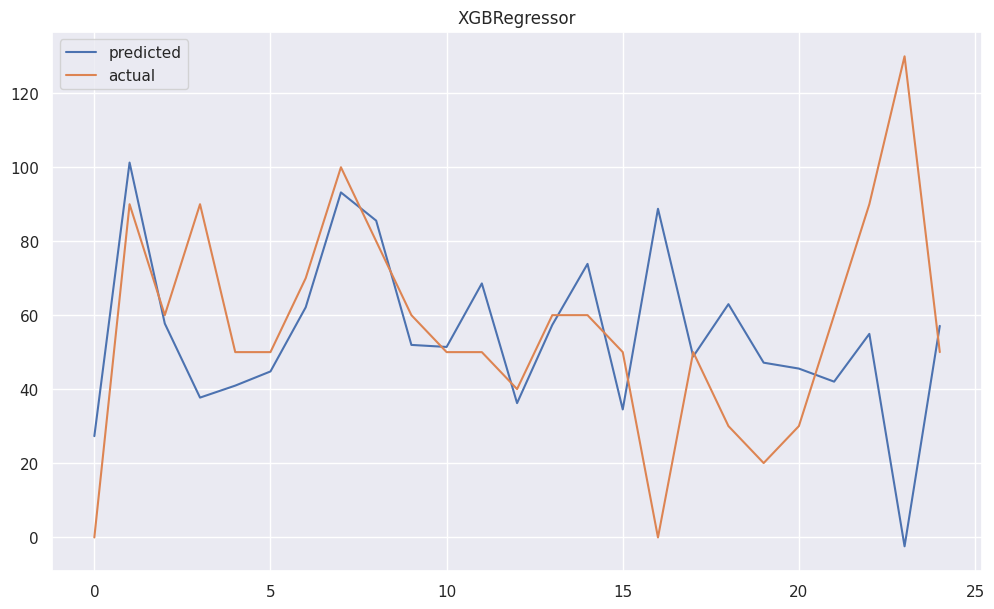

In [ ]:
#Visualizing the Evaluated Model

plt.figure(figsize=(12,7))
plt.plot(y_pred[:25], label='predicted')
plt.plot(Y_test[:25], label='actual')
plt.legend(loc='best')
plt.title('XGBRegressor')

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

After the hyper parameter tuning the XGboost have increased its accuracy on both test data and test data.

it has increased from 72 to 94% for train data and for test it has increased from 32% to 35%. which is very less improvememnt.

In [ ]:

eval_metric=pd.DataFrame({'Models':Model,
                          'train_accuracy':train_accu,
                          'test_accuracy':test_accu})

In [ ]:
eval_metric

,Models,train_accuracy,test_accuracy
0,Linear_Regression,0.145265,0.159853
1,Lasso_Regression,0.144806,0.158793
2,DecisionTreeRegressor,0.525953,0.161806
3,DecisionTreeRegressor_cv,0.649251,0.129503
4,XGBRegressor,0.711530,0.317264
5,XGBRegressor_cv,0.938827,0.331519


##### **Which ML model did you choose from the above created models as your final prediction model and why?**

XGboost is most important for the businesses because it is more close towards correct prediction, in comparison with other ML Model.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

**The Linear Regression Model for pedicting the appliances energy shows the 14% accuracy for training dataste and 15% for testing accuracy.**

**The Lasso  Regularization do not show much significant improvement over the normal Linear Regression.**

**The Decision Tree Regressor have shown a significant improvement for both train and test accuracy. It shows 50% accuracy for training Dataset an 12% accuracy for the testing Dataset. But still the model is very less in its accuracy.**

**So Extreme Gradient Boost Regressor is turn to be most significant model here with highest train and test accuracy , 93% and 35% respectively.**

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***